# Forecast of moving average of the next X days (e.g. 10)

We have found that the sentiment index is a better indicator of market 'riskiness' than the volatility index is, in the sense that it gives better risk adjusted returns over the test period. We therefore want to shift our goal to predicting the sentiment one day ahead. 

To do this we start with the simplest time series models and see how they perform.

Start by loading the index and doing some time series EDA:

## Data loading and EDA

In [1]:
# Load data and define sharpe function to evaluate the models: 
#need volatility data and the data from the risk_adjusted_returns file:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#Get volatility historical data:
url_volatility = 'https://raw.githubusercontent.com/inga-maria01/master_thesis/main/data/volatility_data.csv'
volatility_df = pd.read_csv(url_volatility)
#make the date a datetime object:
volatility_df['Date'] = pd.to_datetime(volatility_df['Date'])

# first we need the historical data: 
url_nasdaq_price = 'https://raw.githubusercontent.com/inga-maria01/master_thesis/main/data/QQQ.csv'
price_df = pd.read_csv(url_nasdaq_price)
price_df['Date'] = pd.to_datetime(price_df['Date'])
price_df.head()
#this dataset includes the prices and the volume!
# we now need to calculate the returns:
price_df['r_ndq'] = (price_df['Adj Close'] - price_df['Adj Close'].shift(1)) / price_df['Adj Close'].shift(1)
price_df.dropna(inplace=True)
price_df.head()

rf_df = pd.read_csv('https://raw.githubusercontent.com/inga-maria01/master_thesis/main/data/IEF.csv')
rf_df['r_rf'] = (rf_df['Adj Close'] - rf_df['Adj Close'].shift(1)) / rf_df['Adj Close'].shift(1)
rf_df.dropna(inplace=True)
rf_df['Date'] = pd.to_datetime(rf_df['Date'])

portfolio_df = pd.merge(price_df[['Date', 'r_ndq']], 
                     rf_df[['Date', 'r_rf']], 
                     on='Date', 
                     how='inner')

portfolio_df = pd.merge(portfolio_df,  
                     volatility_df[['Date', 'Price']],
                     on='Date', 
                     how='inner')

portfolio_df.rename(columns={'Price' : 'Volatility'}, inplace = True)
portfolio_df.head()

r_rf_df = pd.read_csv('https://raw.githubusercontent.com/inga-maria01/master_thesis/main/data/risk_free_rate.csv')

#divide by 100 because it was already in % -> we dont want that here!
#then divide by 252 since its on a yearly basis but everything else is on a daily basis
#(252 ~ number of us trading days a year)
r_rf_df['daily_rf'] = r_rf_df['rf_rate']/(100*250)
r_rf_df['Date'] = pd.to_datetime(r_rf_df['Date'])
#r_rf_df.set_index('Date', inplace=True)
r_rf_df.head()

portfolio_df = pd.merge(portfolio_df, 
                        r_rf_df[['Date', 'rf_rate', 'daily_rf']], 
                        on='Date', 
                        how='inner')

sentiment_index_df = pd.read_excel('https://raw.githubusercontent.com/inga-maria01/master_thesis/main/index/sentiment_index_unweighted_v7.xlsx')
sentiment_index_df.rename(columns={'date':'Date'}, inplace=True)
# sentiment_index_df['lag_sentiment'] = sentiment_index_df['sentiment_score'].shift(1)
sentiment_index_df.head()

portfolio_df_sent = pd.merge(portfolio_df, sentiment_index_df, on='Date', how='inner')
portfolio_df_sent.set_index('Date', inplace=True)
portfolio_df_sent['moving_average_10day'] = portfolio_df_sent['sentiment_score'].rolling(window = 10).mean() # maybe try exponential?

#want to just look at the training period for threshold optimization
#and then just at the test period for calculating the sharpe
portfolio_df_sent_train = portfolio_df_sent[:'2018-06-30'].copy()
portfolio_df_sent_test = portfolio_df_sent['2018-07-01':].copy()


data_df = pd.merge(portfolio_df_sent, price_df[['Date', 'Close', 'Adj Close']], on='Date', how='inner')
data_df = data_df.rename(columns={'Close': 'close_qqq', 'Adj Close': 'adj_close_qqq'})



### Create new target variable: Moving average of the next 10 trading days

In [2]:
portfolio_df_sent

,r_ndq,r_rf,Volatility,rf_rate,daily_rf,sentiment_score,sentiment_slope,moving_average_10day
Date,,,,,,,,
2015-01-05,-0.014669,0.006101,18.00,0.03,1.200000e-06,18.532825,-1.688521,NaN
2015-01-06,-0.013408,0.006718,19.05,0.03,1.200000e-06,16.950898,-0.425215,NaN
2015-01-07,0.012891,-0.000186,17.20,0.03,1.200000e-06,18.343075,-1.852799,NaN
2015-01-08,0.019140,-0.004079,16.61,0.03,1.200000e-06,21.728897,0.104260,NaN
2015-01-09,-0.006583,0.004933,16.60,0.02,8.000000e-07,19.228589,-2.596250,NaN
...,...,...,...,...,...,...,...,...
2019-12-23,0.002641,-0.000906,12.34,1.59,6.360000e-05,25.885680,-0.659049,22.584993
2019-12-24,0.000519,0.001724,12.36,1.58,6.320000e-05,24.838901,-2.178170,23.320627
2019-12-26,0.008824,0.001450,12.58,1.58,6.320000e-05,28.803194,1.745469,23.880173


In [20]:
# future MA includes today as today's sentiment is still unknown before the trading day 
portfolio_df_sent['sentiment_ma_next_10'] = portfolio_df_sent['sentiment_score'].rolling(window=10).mean().shift(-9)


In [22]:
first_10 = []

for i in range(0,10):
    first_10.append(portfolio_df_sent['sentiment_score'].iloc[i])

print(len(first_10))

print(np.mean(first_10))



10
18.55184421972755


In [61]:
first_10

[18.53282505015071,
 16.95089782975807,
 18.34307477925677,
 21.72889652558402,
 19.228589023744,
 18.03047622380463,
 19.79839487082708,
 19.36153776287326,
 16.27031755857658,
 17.27343257270038]

In [62]:
portfolio_df_sent.head(n=15)

,r_ndq,r_rf,Volatility,rf_rate,daily_rf,sentiment_score,sentiment_slope,moving_average_10day,sentiment_ma_next_10
Date,,,,,,,,,
2015-01-05,-0.014669,0.006101,18.00,0.03,1.200000e-06,18.532825,-1.688521,NaN,18.551844
2015-01-06,-0.013408,0.006718,19.05,0.03,1.200000e-06,16.950898,-0.425215,NaN,19.112743
2015-01-07,0.012891,-0.000186,17.20,0.03,1.200000e-06,18.343075,-1.852799,NaN,19.792475
2015-01-08,0.019140,-0.004079,16.61,0.03,1.200000e-06,21.728897,0.104260,NaN,19.955090
2015-01-09,-0.006583,0.004933,16.60,0.02,8.000000e-07,19.228589,-2.596250,NaN,20.192170
2015-01-12,-0.010427,0.003520,17.88,0.03,1.200000e-06,18.030476,0.376702,NaN,20.385270
2015-01-13,-0.000295,0.000923,18.42,0.03,1.200000e-06,19.798395,-1.680963,NaN,20.468942
2015-01-14,-0.005516,0.004610,18.89,0.04,1.600000e-06,19.361538,-1.579964,NaN,20.283600
2015-01-15,-0.012976,0.008536,21.53,0.03,1.200000e-06,16.270318,0.454067,NaN,20.333143


'portfolio_df_sent['sentiment_ma_next_10'] = portfolio_df_sent['sentiment_score'].rolling(window=10).mean().shift(-9)' correctly calculates the future moving average sentiment score.

Plot the future moving average.

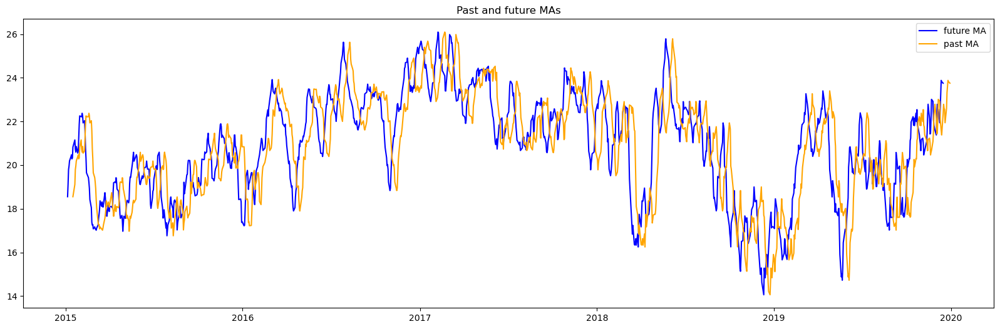

In [28]:
plt.figure(figsize=(20, 6))
plt.plot(portfolio_df_sent['sentiment_ma_next_10'], color = 'blue', label='future MA')
plt.plot(portfolio_df_sent['moving_average_10day'], color = 'orange', label='past MA')
plt.title('Past and future MAs')
plt.legend()
plt.show()

In [46]:
# ma_past = portfolio_df_sent.copy()
# ma_past = ma_past.drop(columns='sentiment_ma_next_10')
# ma_past = ma_past.dropna()

ma_future = portfolio_df_sent.copy()
ma_future = ma_future[ma_future['sentiment_ma_next_10'].notna()]



In [47]:
ma_future

,r_ndq,r_rf,Volatility,rf_rate,daily_rf,sentiment_score,sentiment_slope,moving_average_10day,sentiment_ma_next_10
Date,,,,,,,,,
2015-01-05,-0.014669,0.006101,18.00,0.03,1.200000e-06,18.532825,-1.688521,NaN,18.551844
2015-01-06,-0.013408,0.006718,19.05,0.03,1.200000e-06,16.950898,-0.425215,NaN,19.112743
2015-01-07,0.012891,-0.000186,17.20,0.03,1.200000e-06,18.343075,-1.852799,NaN,19.792475
2015-01-08,0.019140,-0.004079,16.61,0.03,1.200000e-06,21.728897,0.104260,NaN,19.955090
2015-01-09,-0.006583,0.004933,16.60,0.02,8.000000e-07,19.228589,-2.596250,NaN,20.192170
...,...,...,...,...,...,...,...,...,...
2019-12-10,-0.000833,-0.001171,15.51,1.56,6.240000e-05,17.482563,1.564996,22.080314,22.584993
2019-12-11,0.005297,0.004147,14.77,1.57,6.280000e-05,23.207731,0.405708,21.831322,23.320627
2019-12-12,0.007464,-0.007900,14.12,1.56,6.240000e-05,23.146175,2.221181,21.601127,23.880173


## Define new correct sharpe function for future MA

In [64]:
def sharpe_correct(sentiment, version): # version is either sentiment_score or moving_average_10day
    w_ndq = []
    w_rf = []

    # Assuming 'sentiment' is a pandas Series
    
    upper = ma_future[version].shift(1).rolling(63).quantile(0.75) #apply(lambda x: weighted_quantile(x, quantile=0.75), raw=True)
    lower = ma_future[version].shift(1).rolling(63).quantile(0.25) #apply(lambda x: weighted_quantile(x, quantile=0.25), raw=True)
    test_sent = sentiment['2018-07-01':]
    test_df = ma_future['2018-07-01':].copy()
    for i in test_sent.index:
        score = sentiment[i]
        if score > upper[i]: #23: changing to see if it improves
            w_ndq.append(0.8)
            w_rf.append(0.2)
        elif score <= upper[i] and score > lower[i]: # was 20:
            w_ndq.append(0.6)
            w_rf.append(0.4)
        elif score <= lower[i]:
            w_ndq.append(0.2)
            w_rf.append(0.8)
    test_df['w_ndq'] = w_ndq
    test_df['w_rf'] = w_rf
    test_df['r_portfolio'] = test_df['w_ndq'] * test_df['r_ndq'] + test_df['w_rf'] * test_df['r_rf']
    test_df['excess returns'] = test_df['r_portfolio'] - test_df['daily_rf']
    test_df['trading day'] = (test_df['w_ndq'] != test_df['w_ndq'].shift(1)).astype(int)
    
    test_df.reset_index(inplace=True)
    # Identify maximum index in the dataset
    max_index = test_df.index.max()

    # Initialize starting portfolio value
    initial_portfolio_value = 1

    # Create a new DataFrame to store calculated values
    df_calc = pd.DataFrame(index=test_df.index, columns=['portfolio_value', 'ndq_start', 'rf_start', 'ndq_end', 'rf_end'])
    
    # Initialize first values from row 0
    df_calc.loc[0, 'portfolio_value'] = initial_portfolio_value
    df_calc.loc[0, 'ndq_start'] = 0
    df_calc.loc[0, 'rf_start'] = 0
    df_calc.loc[0, 'ndq_end'] = w_ndq[0] * initial_portfolio_value
    df_calc.loc[0, 'rf_end'] = w_rf[0] * initial_portfolio_value

    # Loop through rows from 1 to max_index to calculate the required columns
    for i in range(1, max_index + 1):
        # Calculate ndq_start and rf_start
        df_calc.loc[i, 'ndq_start'] = df_calc.loc[i - 1, 'ndq_end'] * (1 + test_df.loc[i, 'r_ndq'])
        df_calc.loc[i, 'rf_start'] = df_calc.loc[i - 1, 'rf_end'] * (1 + test_df.loc[i, 'r_rf'])

        # Calculate the new portfolio value
        df_calc.loc[i, 'portfolio_value'] = df_calc.loc[i, 'ndq_start'] + df_calc.loc[i, 'rf_start']

        # Calculate ndq_end and rf_end based on updated portfolio value
        df_calc.loc[i, 'ndq_end'] =  w_ndq[i] * df_calc.loc[i, 'portfolio_value']
        df_calc.loc[i, 'rf_end'] = w_rf[i] * df_calc.loc[i, 'portfolio_value']
    
    return2019 = (df_calc['portfolio_value'][-1:]/df_calc['portfolio_value'][0]) **(1/(365/250)) - 1
    risk_free2019 = test_df['rf_rate'].mean()/100
    std2019 = np.std(test_df['excess returns'])*np.sqrt(250)

    test_df.set_index('Date', inplace=True)
    
    return (return2019 - risk_free2019)/std2019, df_calc, test_df, upper, lower



## Sharpe with 60/40 benchmark: 1.045 (code in risk_adjusted_returns file)

## Sharpe with actual sentiment score

In [73]:
ma_future

,r_ndq,r_rf,Volatility,rf_rate,daily_rf,sentiment_score,sentiment_slope,moving_average_10day,sentiment_ma_next_10
Date,,,,,,,,,
2015-01-05,-0.014669,0.006101,18.00,0.03,1.200000e-06,18.532825,-1.688521,NaN,18.551844
2015-01-06,-0.013408,0.006718,19.05,0.03,1.200000e-06,16.950898,-0.425215,NaN,19.112743
2015-01-07,0.012891,-0.000186,17.20,0.03,1.200000e-06,18.343075,-1.852799,NaN,19.792475
2015-01-08,0.019140,-0.004079,16.61,0.03,1.200000e-06,21.728897,0.104260,NaN,19.955090
2015-01-09,-0.006583,0.004933,16.60,0.02,8.000000e-07,19.228589,-2.596250,NaN,20.192170
...,...,...,...,...,...,...,...,...,...
2019-12-10,-0.000833,-0.001171,15.51,1.56,6.240000e-05,17.482563,1.564996,22.080314,22.584993
2019-12-11,0.005297,0.004147,14.77,1.57,6.280000e-05,23.207731,0.405708,21.831322,23.320627
2019-12-12,0.007464,-0.007900,14.12,1.56,6.240000e-05,23.146175,2.221181,21.601127,23.880173


In [74]:
sharpe_act, df_calc_act, test_df_act, upper_act, lower_act = sharpe_correct(ma_future['sentiment_score'], 'sentiment_score')
print(sharpe_act)
print(test_df_act['trading day'].sum())


363    1.78273
Name: portfolio_value, dtype: object
199


## Sharpe with future sentiment

In [65]:
sharpe_act_future_ma, df_calc_act_future_ma, test_df_act_future_ma, upper_act_future_ma, lower_act_future_ma = sharpe_correct(ma_future['sentiment_ma_next_10'], 'sentiment_score')
print(sharpe_act_future_ma)
print(test_df_act_future_ma['trading day'].sum())


363    2.329288
Name: portfolio_value, dtype: object
42


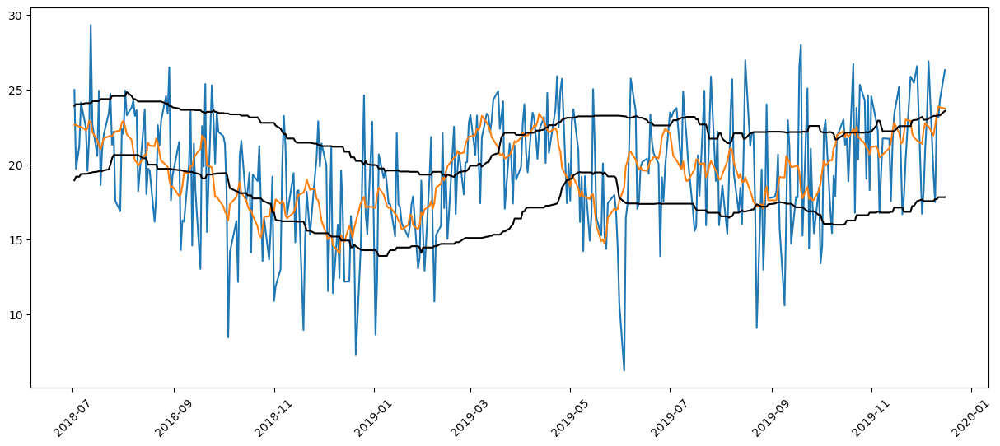

In [66]:
plt.figure(figsize=(15, 6))
plt.plot(ma_future['sentiment_score']['2018-07-01':])
plt.plot(ma_future['sentiment_ma_next_10']['2018-07-01':])
plt.plot(upper_act_future_ma['2018-07-01':], color = 'black')
plt.plot(lower_act_future_ma['2018-07-01':], color = 'black')
plt.xticks(rotation=45) 
plt.show()

In [67]:
sharpe_act_future_ma, df_calc_act_future_ma, test_df_act_future_ma, upper_act_future_ma, lower_act_future_ma = sharpe_correct(ma_future['sentiment_ma_next_10'], 'sentiment_ma_next_10')
print(sharpe_act_future_ma)
print(test_df_act_future_ma['trading day'].sum())


363    3.413475
Name: portfolio_value, dtype: object
54


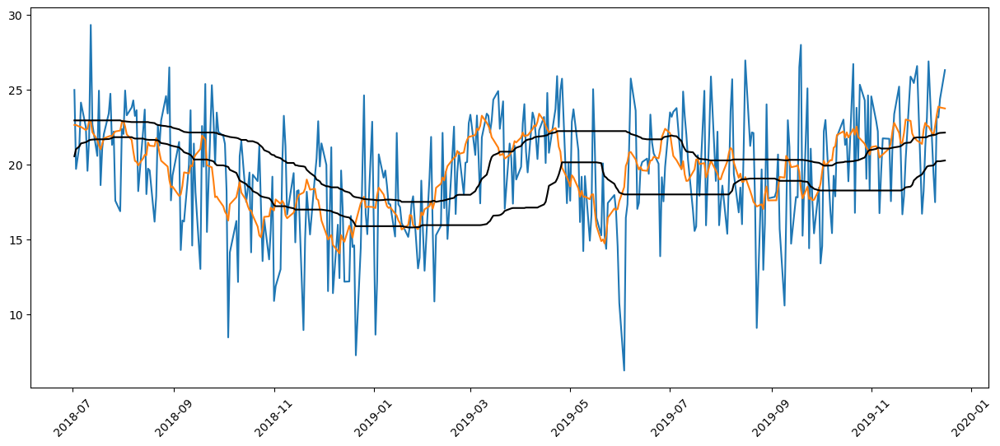

In [68]:
plt.figure(figsize=(15, 6))
plt.plot(ma_future['sentiment_score']['2018-07-01':])
plt.plot(ma_future['sentiment_ma_next_10']['2018-07-01':])
plt.plot(upper_act_future_ma['2018-07-01':], color = 'black')
plt.plot(lower_act_future_ma['2018-07-01':], color = 'black')
plt.xticks(rotation=45) 
plt.show()

In [69]:
sharpe_act_future_ma, df_calc_act_future_ma, test_df_act_future_ma, upper_act_future_ma, lower_act_future_ma = sharpe_correct(ma_future['sentiment_ma_next_10'], 'moving_average_10day')
print(sharpe_act_future_ma)
print(test_df_act_future_ma['trading day'].sum())


363    3.426316
Name: portfolio_value, dtype: object
34


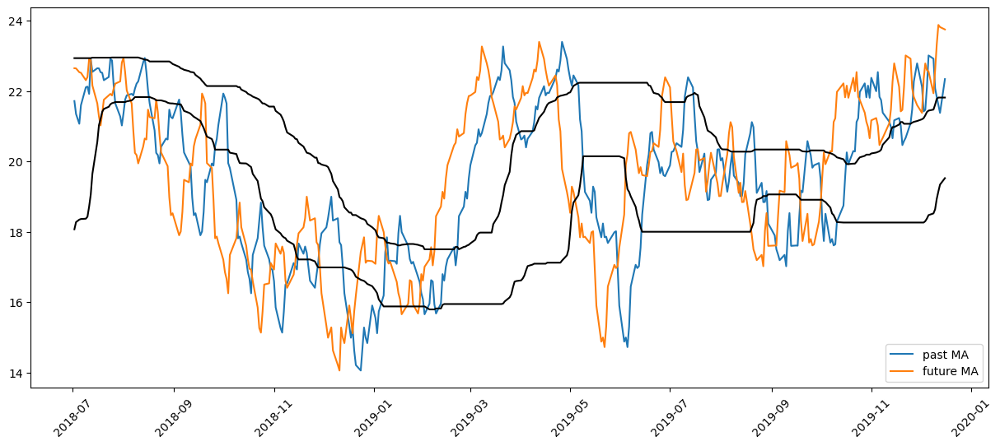

In [70]:
plt.figure(figsize=(15, 6))
plt.plot(ma_future['moving_average_10day']['2018-07-01':], label = 'past MA')
plt.plot(ma_future['sentiment_ma_next_10']['2018-07-01':], label = 'future MA')
plt.plot(upper_act_future_ma['2018-07-01':], color = 'black')
plt.plot(lower_act_future_ma['2018-07-01':], color = 'black')
plt.xticks(rotation=45)
plt.legend(loc='lower right')
plt.show()

In [53]:
QQQ_df = price_df.copy()
QQQ_df.set_index('Date', inplace=True)

QQQ_df_weekdays_test = QQQ_df[~QQQ_df.index.isin(QQQ_df.index.difference(ma_future.index))]


In [71]:
QQQ_df_weekdays_test

,Open,High,Low,Close,Adj Close,Volume,r_ndq
Date,,,,,,,
2015-01-05,102.489998,102.610001,101.139999,101.430000,94.300850,36521300,-0.014669
2015-01-06,101.580002,101.750000,99.620003,100.070000,93.036430,66205500,-0.013408
2015-01-07,100.730003,101.599998,100.489998,101.360001,94.235786,37577400,0.012891
2015-01-08,102.220001,103.500000,102.110001,103.300003,96.039421,40212600,0.019140
2015-01-09,103.620003,103.650002,102.019997,102.620003,95.407211,41410100,-0.006583
...,...,...,...,...,...,...,...
2019-12-10,204.169998,204.880005,203.440002,203.899994,198.230652,21799800,-0.000833
2019-12-11,204.360001,205.190002,204.039993,204.979996,199.280624,18780800,0.005297
2019-12-12,204.770004,207.320007,204.490005,206.509995,200.768066,32612000,0.007464


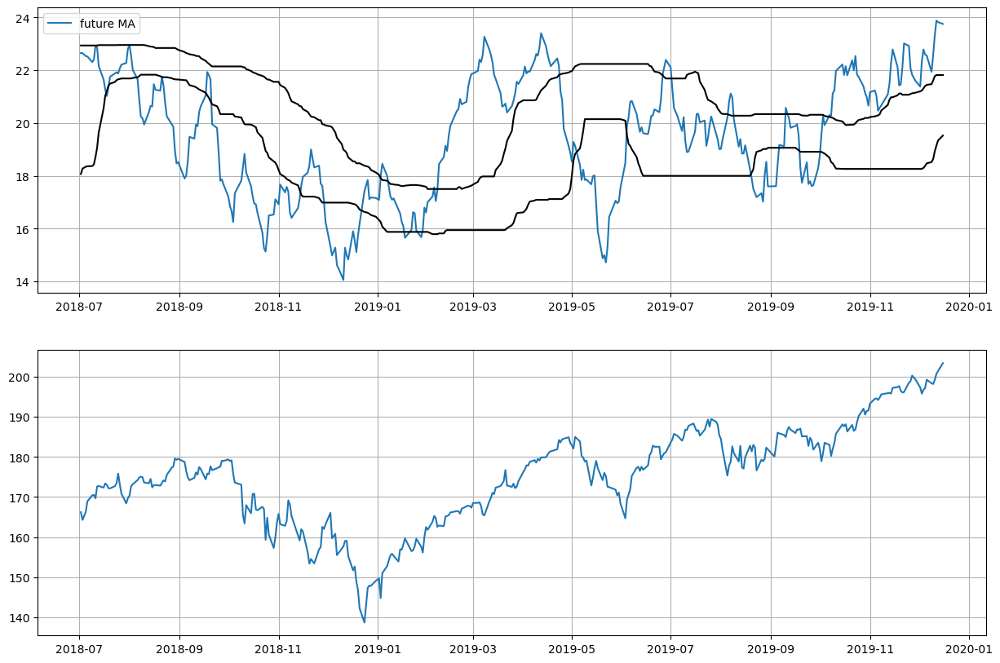

In [72]:
plt.figure(figsize=(15, 10))
plt.subplot(2, 1, 1)
# plt.plot(ma_future['moving_average_10day']['2018-07-01':], label = 'past MA')
plt.plot(ma_future['sentiment_ma_next_10']['2018-07-01':], label = 'future MA')
plt.plot(upper_act_future_ma['2018-07-01':], color = 'black')
plt.plot(lower_act_future_ma['2018-07-01':], color = 'black')
plt.grid(True)
plt.legend()
# plt.xticks(rotation=45)
plt.subplot(2, 1, 2)
plt.plot(QQQ_df_weekdays_test['Adj Close']['2018-07-01':])
plt.grid(True)
plt.show()

In [15]:
sharpe_act_10d_ma, df_calc_act_10d_ma, test_df_act_10d_ma, upper_act_10d_ma, lower_act_10d_ma = sharpe_correct_exp_disc(portfolio_df_sent['moving_average_10day'], 'moving_average_10day')
print(sharpe_act_10d_ma)
print(test_df_act_10d_ma['trading day'].sum())


372    1.364162
Name: portfolio_value, dtype: object
181


## Sharpe with ACTUAL LAGGED sentiment index 

In [84]:
ma_future['sentiment_1lag_act'] =  ma_future['sentiment_score'].shift(1)
ma_future['sentiment_2lag_act'] =  ma_future['sentiment_score'].shift(2)
ma_future['sentiment_3lag_act'] =  ma_future['sentiment_score'].shift(3)



In [86]:
ma_future.head()

,r_ndq,r_rf,Volatility,rf_rate,daily_rf,sentiment_score,sentiment_slope,moving_average_10day,sentiment_ma_next_10,sentiment_1lag_act,sentiment_2lag_act,sentiment_3lag_act
Date,,,,,,,,,,,,
2015-01-05,-0.014669,0.006101,18.00,0.03,1.200000e-06,18.532825,-1.688521,NaN,18.551844,NaN,NaN,NaN
2015-01-06,-0.013408,0.006718,19.05,0.03,1.200000e-06,16.950898,-0.425215,NaN,19.112743,18.532825,NaN,NaN
2015-01-07,0.012891,-0.000186,17.20,0.03,1.200000e-06,18.343075,-1.852799,NaN,19.792475,16.950898,18.532825,NaN
2015-01-08,0.019140,-0.004079,16.61,0.03,1.200000e-06,21.728897,0.104260,NaN,19.955090,18.343075,16.950898,18.532825
2015-01-09,-0.006583,0.004933,16.60,0.02,8.000000e-07,19.228589,-2.596250,NaN,20.192170,21.728897,18.343075,16.950898


In [80]:
sharpe_act_lag, df_calc_act_lag, test_df_act_lag, upper_act_lag, lower_act_lag = sharpe_correct(ma_future['sentiment_1lag_act'], 'sentiment_score')
print(sharpe_act_lag)
print(test_df_act_lag['trading day'].sum())


363    0.429139
Name: portfolio_value, dtype: object
202


In [83]:
sharpe_act_lag_2, df_calc_act_lag_2, test_df_act_lag_2, upper_act_lag_2, lower_act_lag_2 = sharpe_correct(ma_future['sentiment_2lag_act'], 'sentiment_score')
print(sharpe_act_lag_2)
print(test_df_act_lag_2['trading day'].sum())


363    1.408047
Name: portfolio_value, dtype: object
202


In [85]:
sharpe_act_lag_3, df_calc_act_lag_3, test_df_act_lag_3, upper_act_lag_3, lower_act_lag_3 = sharpe_correct(ma_future['sentiment_3lag_act'], 'sentiment_score')
print(sharpe_act_lag_3)
print(test_df_act_lag_3['trading day'].sum())


363    0.639545
Name: portfolio_value, dtype: object
205


For a lag of 2, the results are kinda decent but have way too many trading days.

# ARMA 
#### is not really applicable for future moving average because the most recent lag that we could use would be 10 day lag. More recent lags would include values that we don't actually know yet. We try it in Inga's file

# Machine Learning

#### Tree based methods with several input features

## Testing tree based methods more input features

First, without prolonging market data

In [97]:
ma_future_only = ma_future.copy()
ma_future_only = pd.DataFrame(ma_future_only['sentiment_ma_next_10'])

In [98]:
ma_future_only

,sentiment_ma_next_10
Date,
2015-01-05,18.551844
2015-01-06,19.112743
2015-01-07,19.792475
2015-01-08,19.955090
2015-01-09,20.192170
...,...
2019-12-10,22.584993
2019-12-11,23.320627
2019-12-12,23.880173


In [90]:
# Set date as index
data_df.set_index('Date', inplace=True)

In [91]:
data_df.head()

,r_ndq,r_rf,Volatility,rf_rate,daily_rf,sentiment_score,sentiment_slope,moving_average_10day,close_qqq,adj_close_qqq
Date,,,,,,,,,,
2015-01-05,-0.014669,0.006101,18.00,0.03,1.200000e-06,18.532825,-1.688521,NaN,101.430000,94.300850
2015-01-06,-0.013408,0.006718,19.05,0.03,1.200000e-06,16.950898,-0.425215,NaN,100.070000,93.036430
2015-01-07,0.012891,-0.000186,17.20,0.03,1.200000e-06,18.343075,-1.852799,NaN,101.360001,94.235786
2015-01-08,0.019140,-0.004079,16.61,0.03,1.200000e-06,21.728897,0.104260,NaN,103.300003,96.039421
2015-01-09,-0.006583,0.004933,16.60,0.02,8.000000e-07,19.228589,-2.596250,NaN,102.620003,95.407211


#### Merge data_df with ma_future

In [99]:
merged_df = ma_future_only.join(data_df, how='inner')

In [100]:
merged_df

,sentiment_ma_next_10,r_ndq,r_rf,Volatility,rf_rate,daily_rf,sentiment_score,sentiment_slope,moving_average_10day,close_qqq,adj_close_qqq
Date,,,,,,,,,,,
2015-01-05,18.551844,-0.014669,0.006101,18.00,0.03,1.200000e-06,18.532825,-1.688521,NaN,101.430000,94.300850
2015-01-06,19.112743,-0.013408,0.006718,19.05,0.03,1.200000e-06,16.950898,-0.425215,NaN,100.070000,93.036430
2015-01-07,19.792475,0.012891,-0.000186,17.20,0.03,1.200000e-06,18.343075,-1.852799,NaN,101.360001,94.235786
2015-01-08,19.955090,0.019140,-0.004079,16.61,0.03,1.200000e-06,21.728897,0.104260,NaN,103.300003,96.039421
2015-01-09,20.192170,-0.006583,0.004933,16.60,0.02,8.000000e-07,19.228589,-2.596250,NaN,102.620003,95.407211
...,...,...,...,...,...,...,...,...,...,...,...
2019-12-10,22.584993,-0.000833,-0.001171,15.51,1.56,6.240000e-05,17.482563,1.564996,22.080314,203.899994,198.230652
2019-12-11,23.320627,0.005297,0.004147,14.77,1.57,6.280000e-05,23.207731,0.405708,21.831322,204.979996,199.280624
2019-12-12,23.880173,0.007464,-0.007900,14.12,1.56,6.240000e-05,23.146175,2.221181,21.601127,206.509995,200.768066


In [101]:
merged_df = merged_df.drop(columns=['rf_rate', 'daily_rf', 'adj_close_qqq'])

In [102]:
merged_df

,sentiment_ma_next_10,r_ndq,r_rf,Volatility,sentiment_score,sentiment_slope,moving_average_10day,close_qqq
Date,,,,,,,,
2015-01-05,18.551844,-0.014669,0.006101,18.00,18.532825,-1.688521,NaN,101.430000
2015-01-06,19.112743,-0.013408,0.006718,19.05,16.950898,-0.425215,NaN,100.070000
2015-01-07,19.792475,0.012891,-0.000186,17.20,18.343075,-1.852799,NaN,101.360001
2015-01-08,19.955090,0.019140,-0.004079,16.61,21.728897,0.104260,NaN,103.300003
2015-01-09,20.192170,-0.006583,0.004933,16.60,19.228589,-2.596250,NaN,102.620003
...,...,...,...,...,...,...,...,...
2019-12-10,22.584993,-0.000833,-0.001171,15.51,17.482563,1.564996,22.080314,203.899994
2019-12-11,23.320627,0.005297,0.004147,14.77,23.207731,0.405708,21.831322,204.979996
2019-12-12,23.880173,0.007464,-0.007900,14.12,23.146175,2.221181,21.601127,206.509995


In [104]:
original_features = merged_df.columns

original_features

Index(['sentiment_ma_next_10', 'r_ndq', 'r_rf', 'Volatility',
       'sentiment_score', 'sentiment_slope', 'moving_average_10day',
       'close_qqq'],
      dtype='object')

In [112]:
# want to use lagged values of everything but the future moving average itself

import pandas as pd

original_features = merged_df.columns

df = merged_df.copy()
# Create lagged features
for feature in original_features:
    for lag in range(1, 4):  # 3 lags
        df[f'{feature}_lag_{lag}'] = df[feature].shift(lag)

# Drop rows with NaN values that were created due to lagging
df = df.dropna()

# Split the data into training and testing sets based on the year
train_ma_df = df[:'2018-06-30']
test_ma_df = df['2018-07-01':]

# Prepare features and target variables
features_ma = [f for f in df.columns if 'lag' in f and 'sentiment_ma_next' not in f]

X_train_ma = train_ma_df[features_ma]
y_train_ma = train_ma_df['sentiment_ma_next_10']

X_test_ma = test_ma_df[features_ma]
y_test_ma = test_ma_df['sentiment_ma_next_10']


Tune hyperparameters with CV

In [115]:
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.model_selection import  GridSearchCV, RandomizedSearchCV
import xgboost as xgb
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, r2_score

# new y_train : train_residuals, new y_test : test_residuals

# Models to be used
models = {
    "Random Forest": RandomForestRegressor(random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(random_state=42)
    #"XGBoost": xgb.XGBRegressor(random_state = 42)
}

# Hyperparameters for tuning
parameters = {
    "Random Forest": {'n_estimators': range(80,105), 'max_depth': [1,2,3], 'min_samples_leaf': [1, 2, 3]},
    "Gradient Boosting": {'n_estimators': range(100, 140), 'learning_rate': np.linspace(0.1,0.5,7), 'max_depth': [1,2,3], 'min_samples_leaf': [1, 2, 3]}
    #"XGBoost": {'n_estimators': range(5,15), 'learning_rate': }
}

# Storing model performance
model_performance_ma = {}
# model_predictions_ma = {}

# Tuning hyperparameters and evaluating each model
for model_name in models:
    print('Model:  ', model_name)
    model = models[model_name]
    params = parameters[model_name]
    print(params)
    
    # Using GridSearchCV for hyperparameter tuning
    param_search = GridSearchCV(estimator=model, param_grid=params, cv=TimeSeriesSplit(), scoring='neg_mean_squared_error')
    param_search.fit(X_train_ma, y_train_ma)

    # Best model
    best_model = param_search.best_estimator_
    best_score = param_search.best_score_
    best_params = param_search.best_params_

    
    #Print the best model:
    print(best_model)
    print(best_score)
    
    # Predict on test set
    # y_pred = best_model.predict(X_test_ma)

    # Evaluate the model
    # rmse = np.sqrt(mean_squared_error(y_test_ma, y_pred))
    # r2 = r2_score(y_test_ma, y_pred)

    # Store results
    model_performance_ma[model_name] = {
                                    # 'RMSE': rmse, 
                                    #  'R2': r2,
                                     'Best_params': best_params,
                                     'Best_model': best_model,
                                     'Best_score': best_score}

    # Store predictions to use for visualization:
    # model_predictions_2[model_name] = {'y_pred' : y_pred}
    
# Output model performance

print(model_performance_ma)

Model:   Random Forest
{'n_estimators': range(80, 105), 'max_depth': [1, 2, 3], 'min_samples_leaf': [1, 2, 3]}


KeyboardInterrupt: 

Model:   Random Forest
{'n_estimators': range(80, 105), 'max_depth': [1, 2, 3], 'min_samples_leaf': [1, 2, 3]}
RandomForestRegressor(max_depth=3, min_samples_leaf=2, n_estimators=90,
                      random_state=42)
-4.830893030891028
Model:   Gradient Boosting
{'n_estimators': range(100, 140), 'learning_rate': array([0.1       , 0.16666667, 0.23333333, 0.3       , 0.36666667,
       0.43333333, 0.5       ]), 'max_depth': [1, 2, 3], 'min_samples_leaf': [1, 2, 3]}
GradientBoostingRegressor(learning_rate=0.16666666666666669, max_depth=1,
                          n_estimators=111, random_state=42)
-3.8325734320453693
{'Random Forest': {'Best_params': {'max_depth': 3, 'min_samples_leaf': 2, 'n_estimators': 90}, 'Best_model': RandomForestRegressor(max_depth=3, min_samples_leaf=2, n_estimators=90,
                      random_state=42), 'Best_score': -4.830893030891028}, 'Gradient Boosting': {'Best_params': {'learning_rate': 0.16666666666666669, 'max_depth': 1, 'min_samples_leaf': 1, 'n_estimators': 111}, 'Best_model': GradientBoostingRegressor(learning_rate=0.16666666666666669, max_depth=1,
                          n_estimators=111, random_state=42), 'Best_score': -3.8325734320453693}}

Try higher n_estimators for Gradient Boosting as it's robust to over-fitting.

### Train with rolling window

In [116]:
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

# Models to be used
models = {
    "Random Forest": RandomForestRegressor(random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(random_state=42)
}

# Hyperparameters for tuning (simplified for rolling window example)
parameters = {
    "Random Forest": {'n_estimators': 90, 'max_depth': 3, 'min_samples_leaf' : 3},
    "Gradient Boosting": {'n_estimators': 120, 'max_depth': 3, 'learning_rate': 0.1, 'min_samples_leaf' : 3}
    # "Gradient Boosting": {'n_estimators': 98, 'max_depth': 2, 'learning_rate': 0.23333333333333334} # not better than current one
}

# Initialize dictionaries to store results
model_performance_rw_ma = {}
model_predictions_rw_ma = {}

# Create test and train data set with date index
X_train_idx = X_train_ma.copy()
# X_train_idx.set_index()
y_train_idx = pd.DataFrame(y_train_ma).copy()

X_test_idx = X_test_ma.copy()
y_test_idx = pd.DataFrame(y_test_ma).copy()

# Implementing rolling window forecasting
for model_name in models:
    print('Model:  ', model_name)
    model = models[model_name]
    params = parameters[model_name]

    # Initialize storage for predictions and actuals
    predictions = []
    feature_importances = []
    # actuals = y_test_idx
    #print(actuals.head())

    # Start rolling window forecast
    for i in X_test_idx.index:

        # Scale x train:
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train_idx)
        X_train_scaled_df = pd.DataFrame(X_train_scaled, columns = X_train_idx.columns)
        model.set_params(**params)
        # model.fit(X_train_scaled_df, y_train_idx)
        model.fit(X_train_scaled_df, y_train_idx.values.ravel())


        # Obtain feature importance
        importance = model.feature_importances_
        feature_importances.append(importance)

        # Scale x test for the current point:
        X_test_scaled = scaler.transform(X_test_idx.loc[[i]])
        X_test_scaled_df = pd.DataFrame(X_test_scaled, columns = X_test_idx.columns)
    
        # Make a prediction for the next point
        next_point_prediction = model.predict(X_test_scaled_df)
        predictions.append(next_point_prediction[0])

        # Rolling feature window
        # X_test_to_train = pd.Series([X_test[i]], index=[i])
        X_test_to_train = X_test_idx.loc[[i]]
        print(X_test_to_train)
        X_train_idx = pd.concat([X_train_idx, X_test_to_train])
        X_train_idx = X_train_idx.iloc[1:]

        # Rolling target variable window
        y_test_to_train = y_test_idx.loc[[i]]
        print(y_test_to_train)
        y_train_idx = pd.concat([y_train_idx, y_test_to_train])
        y_train_idx = y_train_idx.iloc[1:]
    
    # Calculate performance metrics
    rmse = np.sqrt(mean_squared_error(y_test_ma, predictions))
    r2 = r2_score(y_test_ma, predictions)

    # Store results
    model_performance_rw_ma[model_name] = {'RMSE': rmse, 'R2': r2}
    model_predictions_rw_ma[model_name] = {'y_pred': predictions, 'feature_importance': feature_importances}

# Output model performance
print(model_performance_rw_ma)


Model:   Random Forest


            r_ndq_lag_1  r_ndq_lag_2  r_ndq_lag_3  r_rf_lag_1  r_rf_lag_2  \
Date                                                                        
2018-07-02     0.002687     0.008602    -0.013599    -0.00078   -0.000973   

            r_rf_lag_3  Volatility_lag_1  Volatility_lag_2  Volatility_lag_3  \
Date                                                                           
2018-07-02    0.003812             19.26             20.06             19.67   

            sentiment_score_lag_1  ...  sentiment_score_lag_3  \
Date                               ...                          
2018-07-02              19.547577  ...              19.477187   

            sentiment_slope_lag_1  sentiment_slope_lag_2  \
Date                                                       
2018-07-02               -1.91969               1.807002   

            sentiment_slope_lag_3  moving_average_10day_lag_1  \
Date                                                            
2018-07-02          

"Random Forest": {'n_estimators': 98, 'max_depth': 3, 'min_samples_leaf' : 3},
    "Gradient Boosting": {'n_estimators': 120, 'max_depth': 3, 'learning_rate': 0.1, 'min_samples_leaf' : 3}
{'Random Forest': {'RMSE': 0.6116050586352836, 'R2': 0.9268803198974988}, 'Gradient Boosting': {'RMSE': 0.30756454418293305, 'R2': 0.9815088175926033}}


In [117]:
gb_feature_importance = model_predictions_rw_ma['Gradient Boosting']['feature_importance']
gb_feature_importance_avg = np.mean(gb_feature_importance, axis=0)


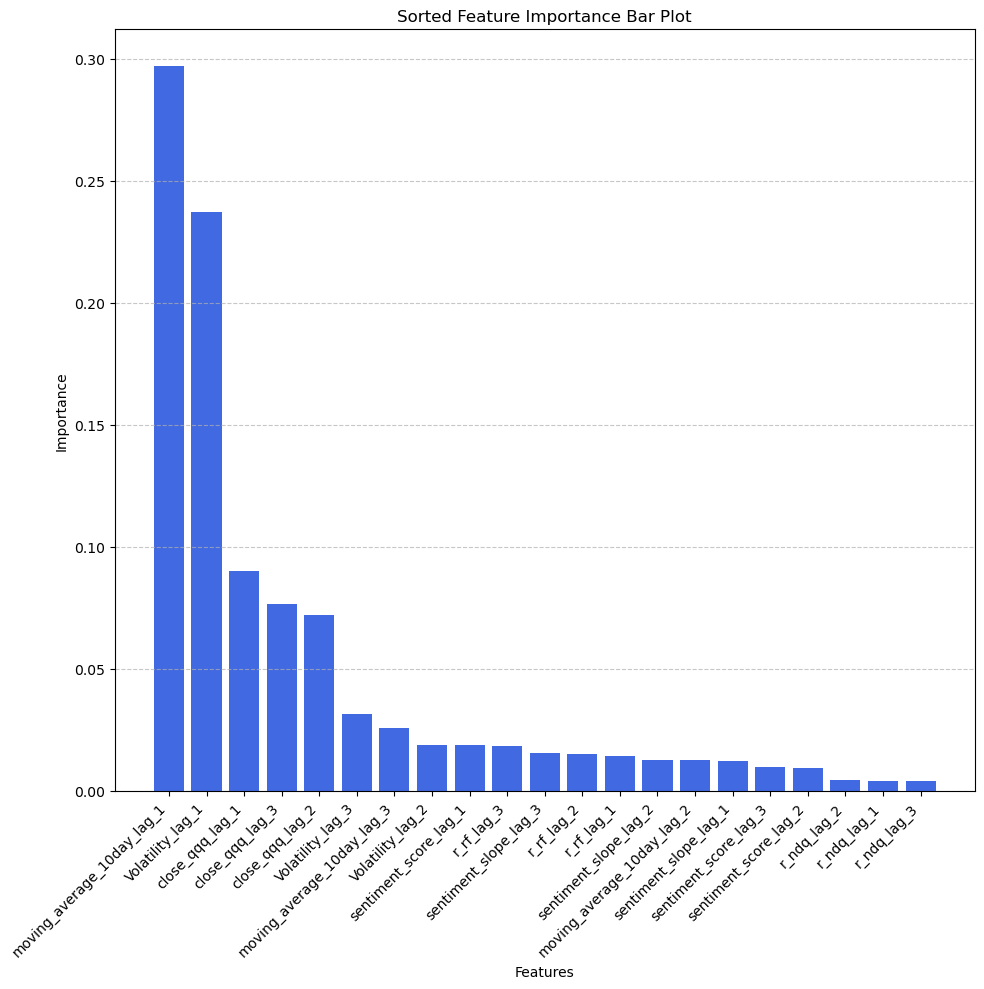

In [120]:
# Assuming that `gb_feature_importance_avg_2` contains the importance scores in the same order as `labels`
# Combine labels and importance scores into a list of tuples

labels = X_train_ma.columns

feature_importance = list(zip(labels, gb_feature_importance_avg))

# Sort the list of tuples by importance scores in descending order
sorted_features = sorted(feature_importance, key=lambda x: x[1], reverse=True)

# Extract sorted features and their corresponding scores
sorted_labels, sorted_importances = zip(*sorted_features)

# Plot the sorted features as a bar plot
plt.figure(figsize=(10, 10))
plt.bar(sorted_labels, sorted_importances, color='royalblue')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Sorted Feature Importance Bar Plot')
plt.xticks(rotation=45, ha="right")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [121]:
gb_ma_predictions = model_predictions_rw_ma['Gradient Boosting']['y_pred']

In [123]:
len(gb_ma_predictions)

364

In [125]:
gb_ma_pred_series = pd.Series(gb_ma_predictions)
gb_ma_pred_series.index = pd.to_datetime(X_test_ma.index)

In [126]:
# 0.25/75, 1.24, 44 trading days / 0.33/66, many inputs

sharpe_gb_ma, df_calc_gb_ma, test_df_gb_ma, upper_gb_ma, lower_gb_ma = sharpe_correct(gb_ma_pred_series, 'moving_average_10day')
print(sharpe_gb_ma)
test_df_gb_ma['trading day'].sum()

363    2.870626
Name: portfolio_value, dtype: object


40

In [130]:
portfolio_value_ma = df_calc_gb_ma['portfolio_value']
portfolio_value_ma

0             1
1      0.994073
2      1.001515
3      1.011215
4      1.015648
         ...   
359    1.419904
360    1.427098
361    1.433365
362    1.438827
363    1.449036
Name: portfolio_value, Length: 364, dtype: object

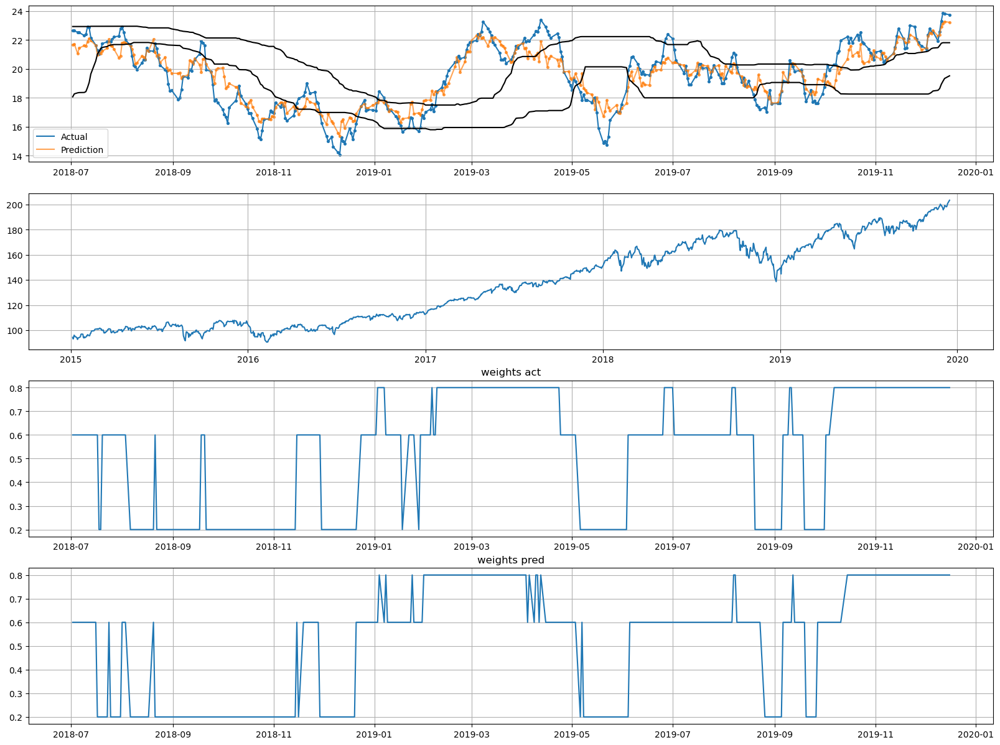

In [128]:
weights_act = test_df_act_future_ma['w_ndq']
weights_pred = test_df_gb_ma['w_ndq']

plt.figure(figsize=(20, 15))
plt.subplot(4, 1, 1)
plt.plot(y_test_ma, label = 'Actual')
plt.scatter(x=y_test_ma.index, y=y_test_ma, s=7)
plt.plot(gb_ma_pred_series, alpha=0.7, label = 'Prediction')
plt.scatter(x=gb_ma_pred_series.index, y=gb_ma_pred_series, s=7, alpha=0.7)
plt.plot(upper_gb_ma['2018-07-01':], color = 'black')
plt.plot(lower_gb_ma['2018-07-01':], color = 'black')
plt.grid(True)
plt.legend()
plt.subplot(4, 1, 2)
plt.plot(QQQ_df_weekdays_test['Adj Close'])
plt.grid(True)

plt.subplot(4, 1, 3)
plt.plot(weights_act)
plt.grid(True)
plt.title('weights act')
plt.subplot(4, 1, 4)
plt.plot(weights_pred)
plt.grid(True)
plt.title('weights pred')

plt.show()

#### Random forest

In [116]:
rf_feature_importance_2 = model_predictions_ma_2['Random Forest']['feature_importance']
rf_feature_importance_avg_2 = np.mean(rf_feature_importance_2, axis=0)


In [119]:
rf_feature_importance_avg_2.sort

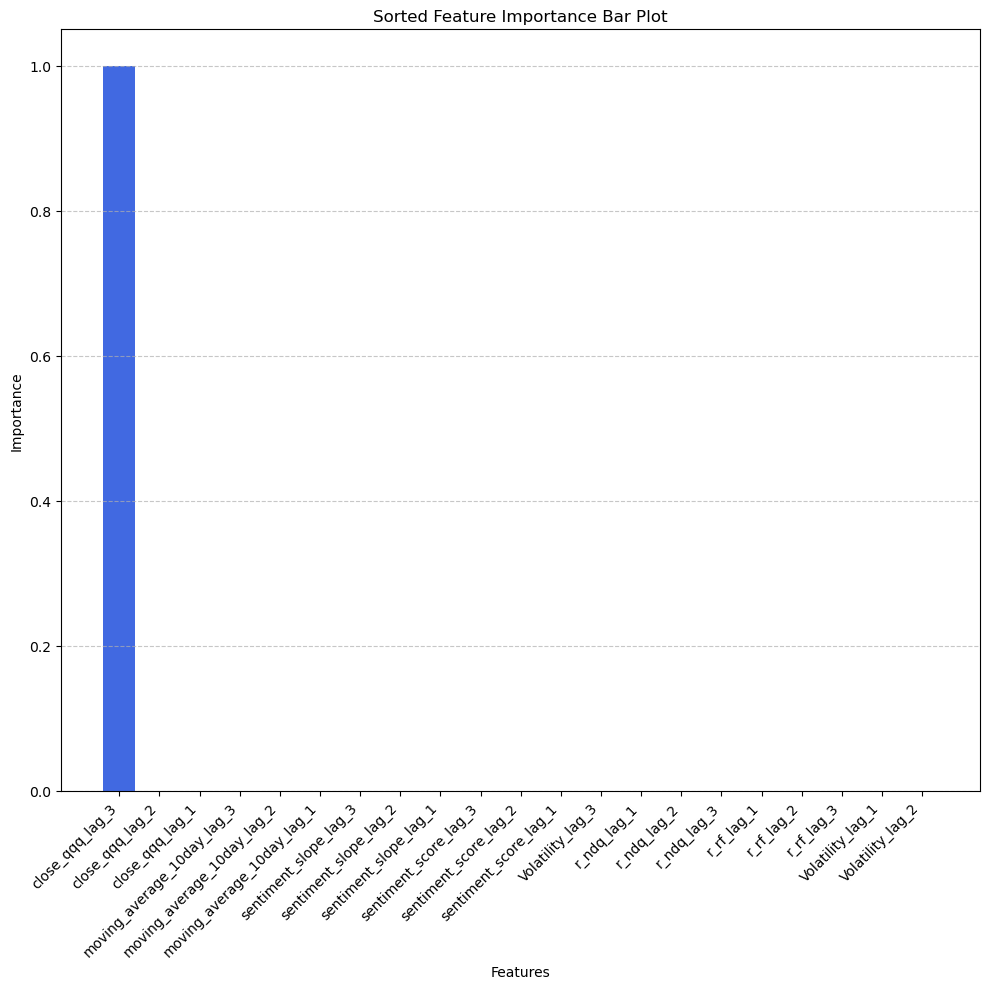

In [129]:
# Assuming that `gb_feature_importance_avg_2` contains the importance scores in the same order as `labels`
# Combine labels and importance scores into a list of tuples
feature_importance = list(zip(labels, rf_feature_importance_avg_2))

# Sort the list of tuples by importance scores in descending order
sorted_features = sorted(feature_importance, key=lambda x: x[1], reverse=True)

# Extract sorted features and their corresponding scores
sorted_labels, sorted_importances = zip(*sorted_features)

# Plot the sorted features as a bar plot
plt.figure(figsize=(10, 10))
plt.bar(sorted_labels, sorted_importances, color='royalblue')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Sorted Feature Importance Bar Plot')
plt.xticks(rotation=45, ha="right")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [132]:
rf_ma_predictions_2 = model_predictions_ma_2['Random Forest']['y_pred']

In [133]:
rf_ma_pred_series_2 = pd.Series(rf_ma_predictions_2)
rf_ma_pred_series_2.index = pd.to_datetime(X_test_ma_2.index)

In [134]:
# 0.25/75, 1.19, 55 trading days / 0.33/66, many inputs

sharpe_rf_ma_2, df_calc_rf_ma_2, test_df_rf_ma_2, upper_rf_ma_2, lower_rf_ma_2 = sharpe_correct(rf_ma_pred_series_2, 'moving_average_10day')
print(sharpe_rf_ma_2)
test_df_rf_ma_2['trading day'].sum()

372    1.193226
Name: portfolio_value, dtype: object


55

### Train tree based models with most important features
(Afterwards, give 9 lags of sentiment score)

In [138]:
X_train_ma_2.columns

Index(['r_ndq_lag_1', 'r_ndq_lag_2', 'r_ndq_lag_3', 'r_rf_lag_1', 'r_rf_lag_2',
       'r_rf_lag_3', 'Volatility_lag_1', 'Volatility_lag_2',
       'Volatility_lag_3', 'sentiment_score_lag_1', 'sentiment_score_lag_2',
       'sentiment_score_lag_3', 'sentiment_slope_lag_1',
       'sentiment_slope_lag_2', 'sentiment_slope_lag_3',
       'moving_average_10day_lag_1', 'moving_average_10day_lag_2',
       'moving_average_10day_lag_3', 'close_qqq_lag_1', 'close_qqq_lag_2',
       'close_qqq_lag_3'],
      dtype='object')

In [139]:
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

# Models to be used
models = {
    "Random Forest": RandomForestRegressor(random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(random_state=42)
}

# Hyperparameters for tuning (simplified for rolling window example)
parameters = {
    "Random Forest": {'n_estimators': 98, 'max_depth': 3, 'min_samples_leaf' : 3},
    "Gradient Boosting": {'n_estimators': 120, 'max_depth': 3, 'learning_rate': 0.1, 'min_samples_leaf' : 3}
    # "Gradient Boosting": {'n_estimators': 98, 'max_depth': 2, 'learning_rate': 0.23333333333333334} # not better than current one
}

# Initialize dictionaries to store results
model_performance_ma_3 = {}
model_predictions_ma_3 = {}

# Create test and train data set with date index
X_train_idx = X_train_ma_2[['moving_average_10day_lag_1', 'sentiment_score_lag_1', 'sentiment_score_lag_2', 'sentiment_score_lag_3', 'Volatility_lag_1', 'Volatility_lag_3']].copy()
# X_train_idx.set_index()
y_train_idx = pd.DataFrame(y_train_ma_2).copy()

X_test_idx = X_test_ma_2[['moving_average_10day_lag_1', 'sentiment_score_lag_1', 'sentiment_score_lag_2', 'sentiment_score_lag_3', 'Volatility_lag_1', 'Volatility_lag_3']].copy()
y_test_idx = pd.DataFrame(y_test_ma_2).copy()

# Implementing rolling window forecasting
for model_name in models:
    print('Model:  ', model_name)
    model = models[model_name]
    params = parameters[model_name]

    # Initialize storage for predictions and actuals
    predictions = []
    feature_importances = []
    # actuals = y_test_idx
    #print(actuals.head())

    # Start rolling window forecast
    for i in X_test_idx.index:

        # Scale x train:
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train_idx)
        X_train_scaled_df = pd.DataFrame(X_train_scaled, columns = X_train_idx.columns)
        model.set_params(**params)
        # model.fit(X_train_scaled_df, y_train_idx)
        model.fit(X_train_scaled_df, y_train_idx.values.ravel())


        # Obtain feature importance
        importance = model.feature_importances_
        feature_importances.append(importance)

        # Scale x test for the current point:
        X_test_scaled = scaler.transform(X_test_idx.loc[[i]])
        X_test_scaled_df = pd.DataFrame(X_test_scaled, columns = X_test_idx.columns)
    
        # Make a prediction for the next point
        next_point_prediction = model.predict(X_test_scaled_df)
        predictions.append(next_point_prediction[0])

        # Rolling feature window
        # X_test_to_train = pd.Series([X_test[i]], index=[i])
        X_test_to_train = X_test_idx.loc[[i]]
        print(X_test_to_train)
        X_train_idx = pd.concat([X_train_idx, X_test_to_train])
        X_train_idx = X_train_idx.iloc[1:]

        # Rolling target variable window
        y_test_to_train = y_test_idx.loc[[i]]
        print(y_test_to_train)
        y_train_idx = pd.concat([y_train_idx, y_test_to_train])
        y_train_idx = y_train_idx.iloc[1:]
    
    # Calculate performance metrics
    rmse = np.sqrt(mean_squared_error(y_test_ma_2, predictions))
    r2 = r2_score(y_test_ma_2, predictions)

    # Store results
    model_performance_ma_3[model_name] = {'RMSE': rmse, 'R2': r2}
    model_predictions_ma_3[model_name] = {'y_pred': predictions, 'feature_importance': feature_importances}

# Output model performance
print(model_performance_ma_3)


Model:   Random Forest
            moving_average_10day_lag_1  sentiment_score_lag_1  \
Date                                                            
2018-07-02                   21.650982              19.547577   

            sentiment_score_lag_2  sentiment_score_lag_3  Volatility_lag_1  \
Date                                                                         
2018-07-02               26.27854              19.477187             19.26   

            Volatility_lag_3  
Date                          
2018-07-02             19.67  
            moving_average_10day
Date                            
2018-07-02             21.717267
            moving_average_10day_lag_1  sentiment_score_lag_1  \
Date                                                            
2018-07-03                   21.717267               24.98873   

            sentiment_score_lag_2  sentiment_score_lag_3  Volatility_lag_1  \
Date                                                                         
20

results only using 6 most important features:
{'Random Forest': {'RMSE': 0.6111845213460527, 'R2': 0.9269808389497491}, 'Gradient Boosting': {'RMSE': 0.3417691130626285, 'R2': 0.9771672738569694}}

#### Gradinet Boosting


In [140]:
gb_feature_importance_3 = model_predictions_ma_3['Gradient Boosting']['feature_importance']
gb_feature_importance_avg_3 = np.mean(gb_feature_importance_3, axis=0)


In [143]:
X_train_idx

,moving_average_10day_lag_1,sentiment_score_lag_1,sentiment_score_lag_2,sentiment_score_lag_3,Volatility_lag_1,Volatility_lag_3
Date,,,,,,
2018-01-16,22.432289,27.428695,25.375007,23.459880,13.03,12.63
2018-01-17,22.798037,21.479407,27.428695,25.375007,14.18,13.19
2018-01-18,22.587885,21.367942,21.479407,27.428695,13.90,13.03
2018-01-19,22.986593,24.709932,21.367942,21.479407,15.49,14.18
2018-01-22,23.121257,23.919769,24.709932,21.367942,14.38,13.90
...,...,...,...,...,...,...
2019-12-23,21.938549,20.722737,22.724018,19.304922,11.78,11.95
2019-12-24,22.584993,25.885680,20.722737,22.724018,12.34,11.73
2019-12-26,23.320627,24.838901,25.885680,20.722737,12.36,11.78


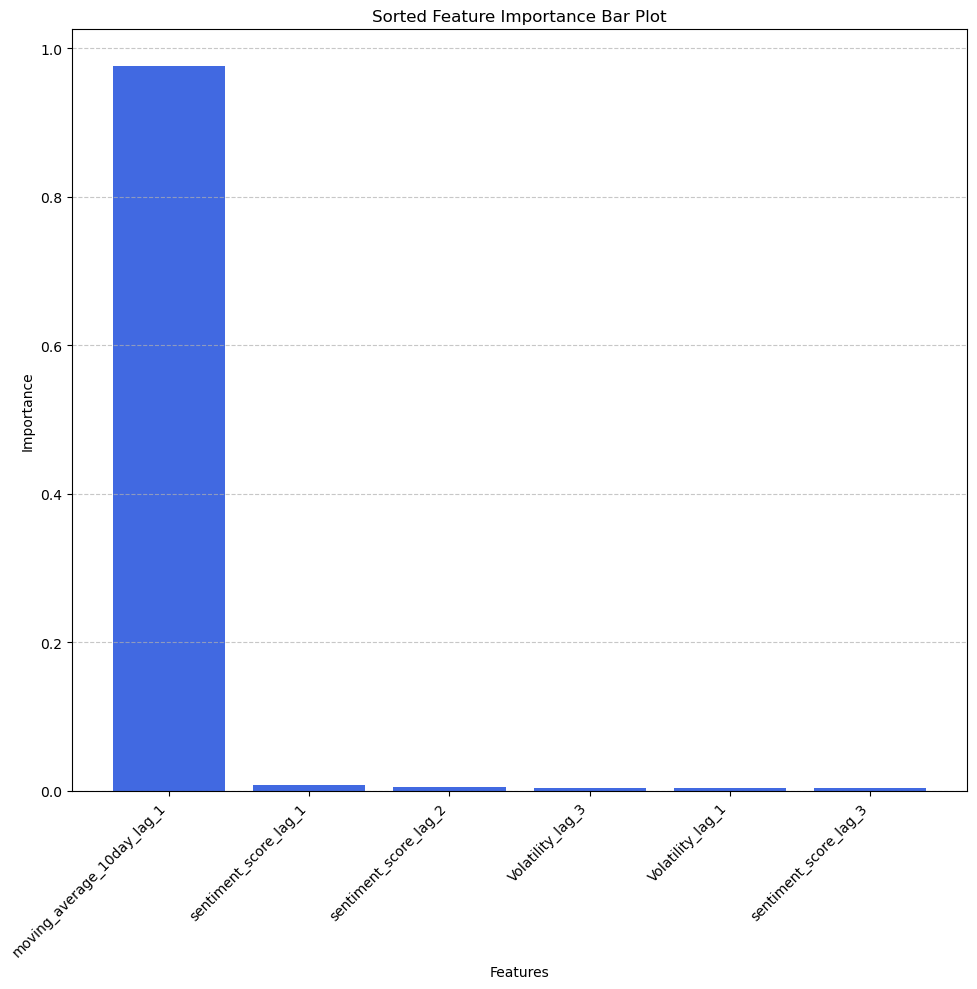

In [145]:
# Assuming that `gb_feature_importance_avg_2` contains the importance scores in the same order as `labels`
labels = X_train_idx.columns
# Combine labels and importance scores into a list of tuples
feature_importance = list(zip(labels, gb_feature_importance_avg_3))

# Sort the list of tuples by importance scores in descending order
sorted_features = sorted(feature_importance, key=lambda x: x[1], reverse=True)

# Extract sorted features and their corresponding scores
sorted_labels, sorted_importances = zip(*sorted_features)

# Plot the sorted features as a bar plot
plt.figure(figsize=(10, 10))
plt.bar(sorted_labels, sorted_importances, color='royalblue')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Sorted Feature Importance Bar Plot')
plt.xticks(rotation=45, ha="right")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [146]:
gb_ma_predictions_3 = model_predictions_ma_3['Gradient Boosting']['y_pred']
len(gb_ma_predictions_3)

373

In [147]:
gb_ma_pred_series_3 = pd.Series(gb_ma_predictions_3)
gb_ma_pred_series_3.index = pd.to_datetime(X_test_ma_2.index)

In [148]:
# 0.25/75, 1.27, 52 trading days / 0.33/66, many inputs

sharpe_gb_ma_3, df_calc_gb_ma_3, test_df_gb_ma_3, upper_gb_ma_3, lower_gb_ma_3 = sharpe_correct(gb_ma_pred_series_3, 'moving_average_10day')
print(sharpe_gb_ma_3)
test_df_gb_ma_3['trading day'].sum()

372    1.276571
Name: portfolio_value, dtype: object


52

#### Random Forest

In [149]:
rf_feature_importance_3 = model_predictions_ma_3['Random Forest']['feature_importance']
rf_feature_importance_avg_3 = np.mean(rf_feature_importance_3, axis=0)


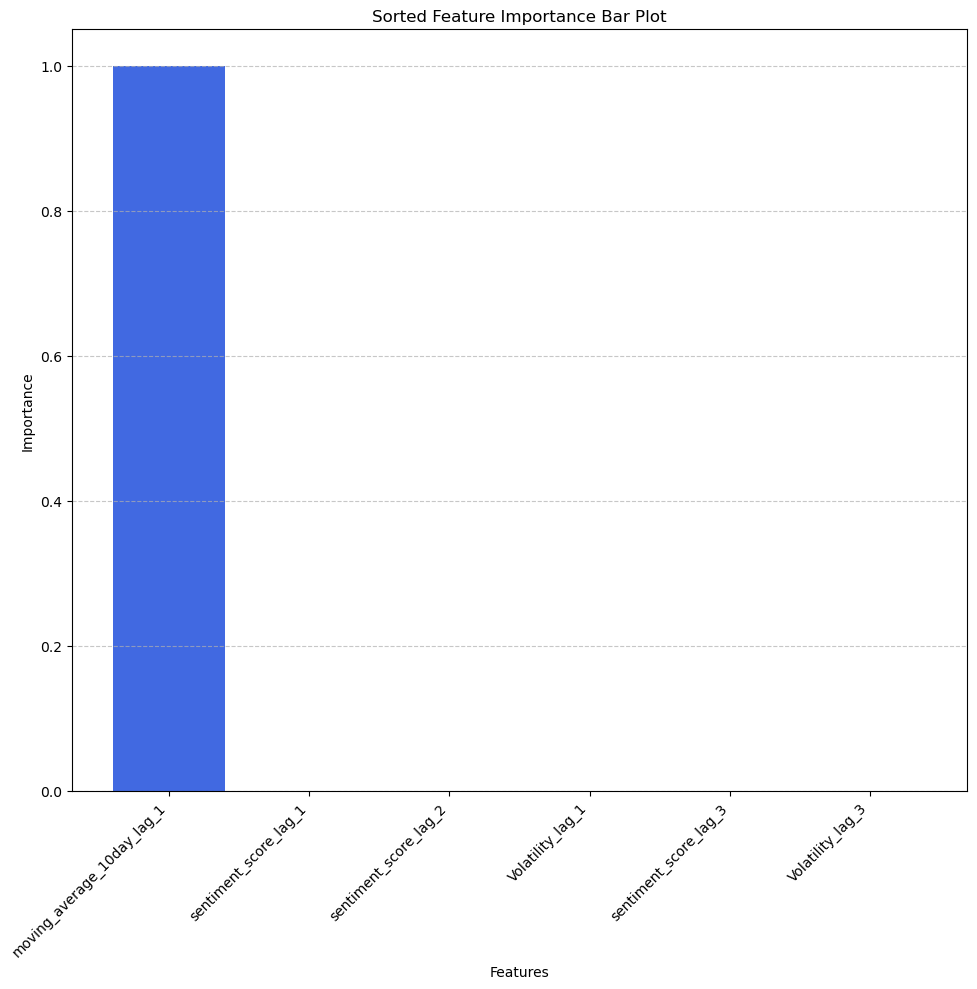

In [150]:
# Assuming that `gb_feature_importance_avg_2` contains the importance scores in the same order as `labels`
labels = X_train_idx.columns
# Combine labels and importance scores into a list of tuples
feature_importance = list(zip(labels, rf_feature_importance_avg_3))

# Sort the list of tuples by importance scores in descending order
sorted_features = sorted(feature_importance, key=lambda x: x[1], reverse=True)

# Extract sorted features and their corresponding scores
sorted_labels, sorted_importances = zip(*sorted_features)

# Plot the sorted features as a bar plot
plt.figure(figsize=(10, 10))
plt.bar(sorted_labels, sorted_importances, color='royalblue')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Sorted Feature Importance Bar Plot')
plt.xticks(rotation=45, ha="right")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [151]:
rf_ma_predictions_3 = model_predictions_ma_3['Random Forest']['y_pred']
len(rf_ma_predictions_3)

373

In [152]:
rf_ma_pred_series_3 = pd.Series(rf_ma_predictions_3)
rf_ma_pred_series_3.index = pd.to_datetime(X_test_ma_2.index)

In [154]:
# 0.25/75, 1.19, 55 trading days / 0.33/66, many inputs

sharpe_rf_ma_3, df_calc_rf_ma_3, test_df_rf_ma_3, upper_rf_ma_3, lower_rf_ma_3 = sharpe_correct(rf_ma_pred_series_3, 'moving_average_10day')
print(sharpe_rf_ma_3)
test_df_rf_ma_3['trading day'].sum()

372    1.193226
Name: portfolio_value, dtype: object


55

#### Now, use 9 lags of sentiment score (since we want to calculate the 10-day MA) and include some other features (exclude 1-lag of MA)

In [166]:
data_df.head()

,r_ndq,r_rf,Volatility,sentiment_score,sentiment_slope,moving_average_10day,close_qqq
Date,,,,,,,
2015-01-05,-0.014669,0.006101,18.00,18.532825,-1.688521,NaN,101.430000
2015-01-06,-0.013408,0.006718,19.05,16.950898,-0.425215,NaN,100.070000
2015-01-07,0.012891,-0.000186,17.20,18.343075,-1.852799,NaN,101.360001
2015-01-08,0.019140,-0.004079,16.61,21.728897,0.104260,NaN,103.300003
2015-01-09,-0.006583,0.004933,16.60,19.228589,-2.596250,NaN,102.620003


In [203]:
data_df

,r_ndq,r_rf,Volatility,sentiment_score,sentiment_slope,moving_average_10day,close_qqq
Date,,,,,,,
2015-01-05,-0.014669,0.006101,18.00,18.532825,-1.688521,NaN,101.430000
2015-01-06,-0.013408,0.006718,19.05,16.950898,-0.425215,NaN,100.070000
2015-01-07,0.012891,-0.000186,17.20,18.343075,-1.852799,NaN,101.360001
2015-01-08,0.019140,-0.004079,16.61,21.728897,0.104260,NaN,103.300003
2015-01-09,-0.006583,0.004933,16.60,19.228589,-2.596250,NaN,102.620003
...,...,...,...,...,...,...,...
2019-12-23,0.002641,-0.000906,12.34,25.885680,-0.659049,22.584993,211.809998
2019-12-24,0.000519,0.001724,12.36,24.838901,-2.178170,23.320627,211.919998
2019-12-26,0.008824,0.001450,12.58,28.803194,1.745469,23.880173,213.789993


In [207]:
# want to use lagged values of the sentiment and the slope to forecast 1 day ahead sentiment. 
# start with just one lag.

import pandas as pd

# Assuming 'sentiment_slope_df' is already defined and loaded

df = data_df.copy()
df = df.drop(columns=['r_ndq', 'r_rf', 'sentiment_slope'])

orig_features = df.columns

# Create lagged features
for feature in orig_features:
    if feature == 'sentiment_score' or feature == 'Volatility':
        for lag in range(1, 10):
            df[f'{feature}_lag_{lag}'] = df[feature].shift(lag)
    else:
        for lag in range(1, 4):  # 3 lags
            df[f'{feature}_lag_{lag}'] = df[feature].shift(lag)

# Drop rows with NaN values that were created due to lagging
df = df.dropna()

# Split the data into training and testing sets based on the year
train_ma_df_4 = df[:'2018-06-30']
test_ma_df_4 = df['2018-07-01':]

# Prepare features and target variables
# features_ma_4 = [f for f in df.columns if 'lag' in f]
features_ma_4 = [f for f in df.columns if 'lag' in f and 'moving_average' not in f]
X_train_ma_4 = train_ma_df_4[features_ma_4]
y_train_ma_4 = train_ma_df_4['moving_average_10day']

X_test_ma_4 = test_ma_df_4[features_ma_4]
y_test_ma_4 = test_ma_df_4['moving_average_10day']


In [208]:
X_train_ma_4

,Volatility_lag_1,Volatility_lag_2,Volatility_lag_3,Volatility_lag_4,Volatility_lag_5,Volatility_lag_6,Volatility_lag_7,Volatility_lag_8,Volatility_lag_9,sentiment_score_lag_1,...,sentiment_score_lag_3,sentiment_score_lag_4,sentiment_score_lag_5,sentiment_score_lag_6,sentiment_score_lag_7,sentiment_score_lag_8,sentiment_score_lag_9,close_qqq_lag_1,close_qqq_lag_2,close_qqq_lag_3
Date,,,,,,,,,,,,,,,,,,,,,
2015-01-22,17.35,18.20,19.81,21.53,18.89,18.42,17.88,16.60,16.61,23.748217,...,17.273433,16.270318,19.361538,19.798395,18.030476,19.228589,21.728897,102.139999,101.620003,100.820000
2015-01-23,15.66,17.35,18.20,19.81,21.53,18.89,18.42,17.88,16.60,19.969223,...,24.141814,17.273433,16.270318,19.361538,19.798395,18.030476,19.228589,104.029999,102.139999,101.620003
2015-01-26,15.47,15.66,17.35,18.20,19.81,21.53,18.89,18.42,17.88,24.099694,...,23.748217,24.141814,17.273433,16.270318,19.361538,19.798395,18.030476,104.260002,104.029999,102.139999
2015-01-27,14.76,15.47,15.66,17.35,18.20,19.81,21.53,18.89,18.42,21.159589,...,19.969223,23.748217,24.141814,17.273433,16.270318,19.361538,19.798395,104.139999,104.260002,104.029999
2015-01-28,16.70,14.76,15.47,15.66,17.35,18.20,19.81,21.53,18.89,18.867201,...,24.099694,19.969223,23.748217,24.141814,17.273433,16.270318,19.361538,101.440002,104.139999,104.260002
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-06-25,16.34,17.03,13.70,14.36,14.29,13.68,14.17,13.60,13.25,17.386042,...,24.007232,23.388936,24.325882,19.646310,26.452244,21.507224,22.994309,175.320007,175.710007,177.250000
2018-06-26,18.89,16.34,17.03,13.70,14.36,14.29,13.68,14.17,13.60,19.393962,...,18.874337,24.007232,23.388936,24.325882,19.646310,26.452244,21.507224,171.369995,175.320007,175.710007
2018-06-27,17.48,18.89,16.34,17.03,13.70,14.36,14.29,13.68,14.17,23.830125,...,17.386042,18.874337,24.007232,23.388936,24.325882,19.646310,26.452244,172.070007,171.369995,175.320007


In [209]:
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

# Models to be used
models = {
    "Random Forest": RandomForestRegressor(random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(random_state=42)
}

# Hyperparameters for tuning (simplified for rolling window example)
parameters = {
    "Random Forest": {'n_estimators': 90, 'max_depth': 3, 'min_samples_leaf' : 4},
    "Gradient Boosting": {'n_estimators': 140, 'max_depth': 4, 'learning_rate': 0.1, 'min_samples_leaf' : 4}
    # "Gradient Boosting": {'n_estimators': 98, 'max_depth': 2, 'learning_rate': 0.23333333333333334} # not better than current one
}

# Initialize dictionaries to store results
model_performance_ma_4 = {}
model_predictions_ma_4 = {}

# Create test and train data set with date index
X_train_idx = X_train_ma_4.copy()
# X_train_idx.set_index()
y_train_idx = pd.DataFrame(y_train_ma_4).copy()

X_test_idx = X_test_ma_4.copy()
y_test_idx = pd.DataFrame(y_test_ma_4).copy()

# Implementing rolling window forecasting
for model_name in models:
    print('Model:  ', model_name)
    model = models[model_name]
    params = parameters[model_name]

    # Initialize storage for predictions and actuals
    predictions = []
    feature_importances = []
    # actuals = y_test_idx
    #print(actuals.head())

    # Start rolling window forecast
    for i in X_test_idx.index:

        # Scale x train:
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train_idx)
        X_train_scaled_df = pd.DataFrame(X_train_scaled, columns = X_train_idx.columns)
        model.set_params(**params)
        # model.fit(X_train_scaled_df, y_train_idx)
        model.fit(X_train_scaled_df, y_train_idx.values.ravel())


        # Obtain feature importance
        importance = model.feature_importances_
        feature_importances.append(importance)

        # Scale x test for the current point:
        X_test_scaled = scaler.transform(X_test_idx.loc[[i]])
        X_test_scaled_df = pd.DataFrame(X_test_scaled, columns = X_test_idx.columns)
    
        # Make a prediction for the next point
        next_point_prediction = model.predict(X_test_scaled_df)
        predictions.append(next_point_prediction[0])

        # Rolling feature window
        # X_test_to_train = pd.Series([X_test[i]], index=[i])
        X_test_to_train = X_test_idx.loc[[i]]
        print(X_test_to_train)
        X_train_idx = pd.concat([X_train_idx, X_test_to_train])
        X_train_idx = X_train_idx.iloc[1:]

        # Rolling target variable window
        y_test_to_train = y_test_idx.loc[[i]]
        print(y_test_to_train)
        y_train_idx = pd.concat([y_train_idx, y_test_to_train])
        y_train_idx = y_train_idx.iloc[1:]
    
    # Calculate performance metrics
    rmse = np.sqrt(mean_squared_error(y_test_ma_4, predictions))
    r2 = r2_score(y_test_ma_4, predictions)

    # Store results
    model_performance_ma_4[model_name] = {'RMSE': rmse, 'R2': r2}
    model_predictions_ma_4[model_name] = {'y_pred': predictions, 'feature_importance': feature_importances}

# Output model performance
print(model_performance_ma_4)


Model:   Random Forest


            Volatility_lag_1  Volatility_lag_2  Volatility_lag_3  \
Date                                                               
2018-07-02             19.26             20.06             19.67   

            Volatility_lag_4  Volatility_lag_5  Volatility_lag_6  \
Date                                                               
2018-07-02             17.48             18.89             16.34   

            Volatility_lag_7  Volatility_lag_8  Volatility_lag_9  \
Date                                                               
2018-07-02             17.03              13.7             14.36   

            sentiment_score_lag_1  ...  sentiment_score_lag_3  \
Date                               ...                          
2018-07-02              19.547577  ...              19.477187   

            sentiment_score_lag_4  sentiment_score_lag_5  \
Date                                                       
2018-07-02              23.830125              19.393962   

        

1. Results

"Random Forest": {'n_estimators': 100, 'max_depth': 3, 'min_samples_leaf' : 4},
    "Gradient Boosting": {'n_estimators': 130, 'max_depth': 4, 'learning_rate': 0.1, 'min_samples_leaf' : 4}
{'Random Forest': {'RMSE': 1.3499300299752963, 'R2': 0.6437829832582787}, 'Gradient Boosting': {'RMSE': 0.14280347333977486, 'R2': 0.9960137026912157}}

input: no MA, 9 lags of sentiment score, 3 lags of everything else 

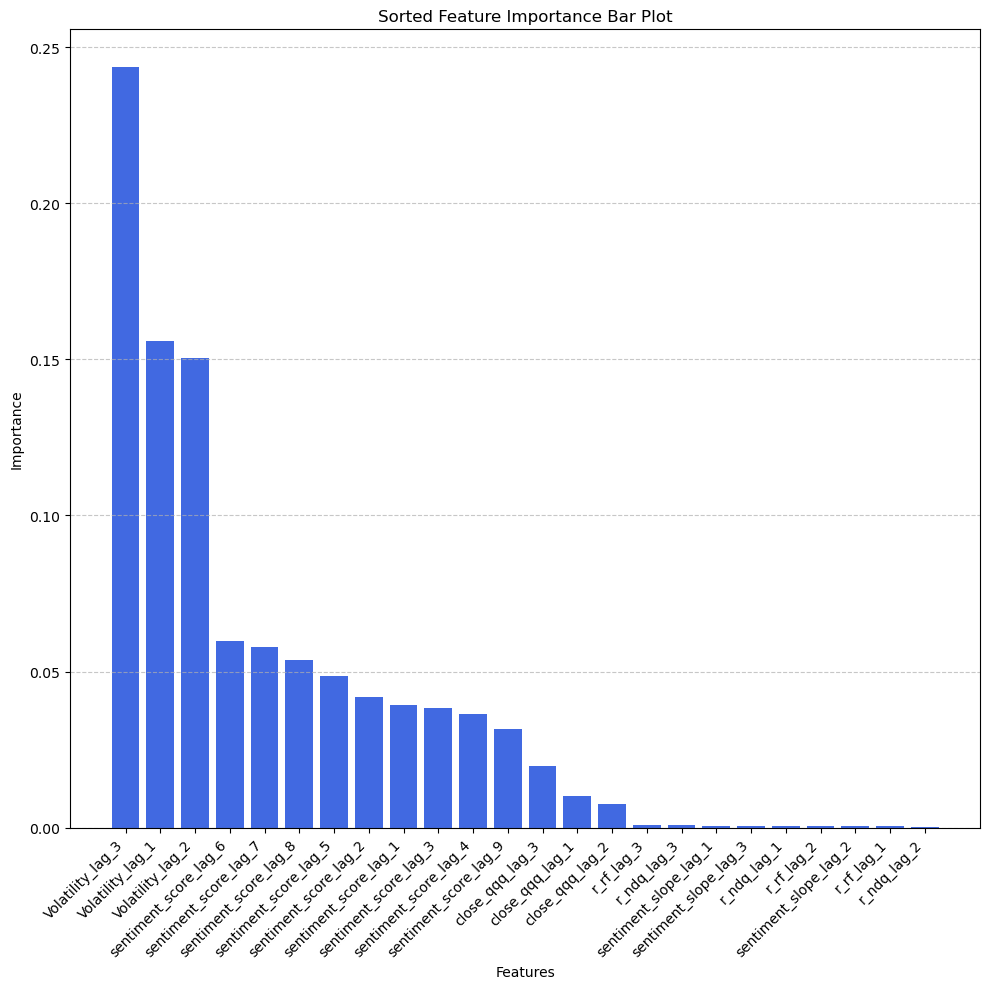

2. Result
{'Random Forest': {'RMSE': 1.3488150736376576, 'R2': 0.6443711654521338}, 'Gradient Boosting': {'RMSE': 0.1390959287643828, 'R2': 0.9962180047207717}}
    "Random Forest": {'n_estimators': 90, 'max_depth': 3, 'min_samples_leaf' : 4},
    "Gradient Boosting": {'n_estimators': 140, 'max_depth': 4, 'learning_rate': 0.1, 'min_samples_leaf' : 4}

input: no MA, 9 lags of sentiment score & volatility, 3 lags of everything else 


#### Gradient Boosting

In [223]:
gb_feature_importance_4 = model_predictions_ma_4['Gradient Boosting']['feature_importance']
gb_feature_importance_avg_4 = np.mean(gb_feature_importance_4, axis=0)


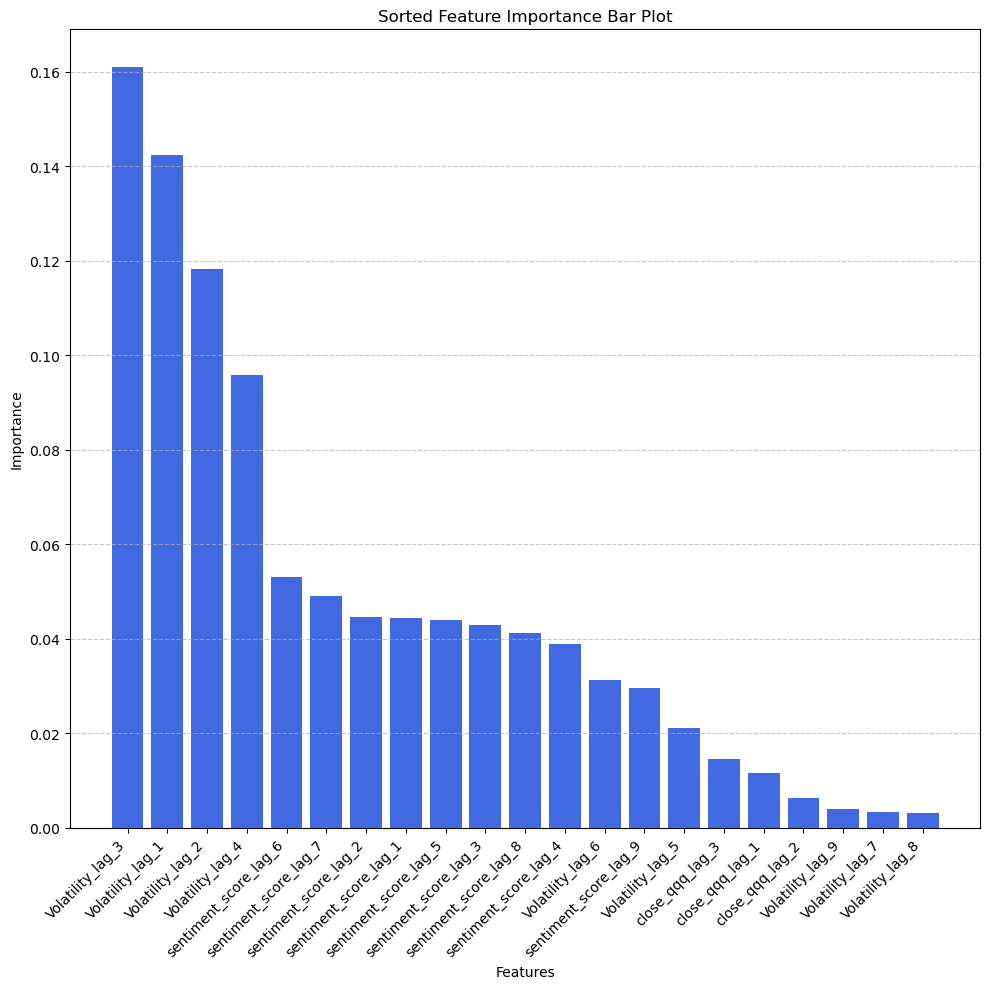

In [224]:
# Assuming that `gb_feature_importance_avg_2` contains the importance scores in the same order as `labels`
labels = X_train_idx.columns
# Combine labels and importance scores into a list of tuples
feature_importance = list(zip(labels, gb_feature_importance_avg_4))

# Sort the list of tuples by importance scores in descending order
sorted_features = sorted(feature_importance, key=lambda x: x[1], reverse=True)

# Extract sorted features and their corresponding scores
sorted_labels, sorted_importances = zip(*sorted_features)

# Plot the sorted features as a bar plot
plt.figure(figsize=(10, 10))
plt.bar(sorted_labels, sorted_importances, color='royalblue')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Sorted Feature Importance Bar Plot')
plt.xticks(rotation=45, ha="right")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [225]:
gb_ma_predictions_4 = model_predictions_ma_4['Gradient Boosting']['y_pred']
len(gb_ma_predictions_4)

373

In [226]:
gb_ma_pred_series_4 = pd.Series(gb_ma_predictions_4)
gb_ma_pred_series_4.index = pd.to_datetime(X_test_ma_4.index)

In [227]:
# 0.25/75, 1.23, 54 trading days / 0.33/66, many inputs

sharpe_gb_ma_4, df_calc_gb_ma_4, test_df_gb_ma_4, upper_gb_ma_4, lower_gb_ma_4 = sharpe_correct(gb_ma_pred_series_4, 'moving_average_10day')
print(sharpe_gb_ma_4)
test_df_gb_ma_4['trading day'].sum()

372    1.236545
Name: portfolio_value, dtype: object


54

In [231]:
# 0.25/75, 1.57, 189 trading days, 0.4 alpha / 0.33/66, VOLQ & Sentiment score 9 lags, some other inputs with 3 lags

sharpe_gb_ma_4_exp, df_calc_gb_ma_4_exp, test_df_gb_ma_4_exp, upper_gb_ma_4_exp, lower_gb_ma_4_exp = sharpe_correct_exp_disc(gb_ma_pred_series_4, 'moving_average_10day')
print(sharpe_gb_ma_4_exp)
test_df_gb_ma_4_exp['trading day'].sum()

372    0.828567
Name: portfolio_value, dtype: object


108

In [ ]:
upper_gb_ma_4[]

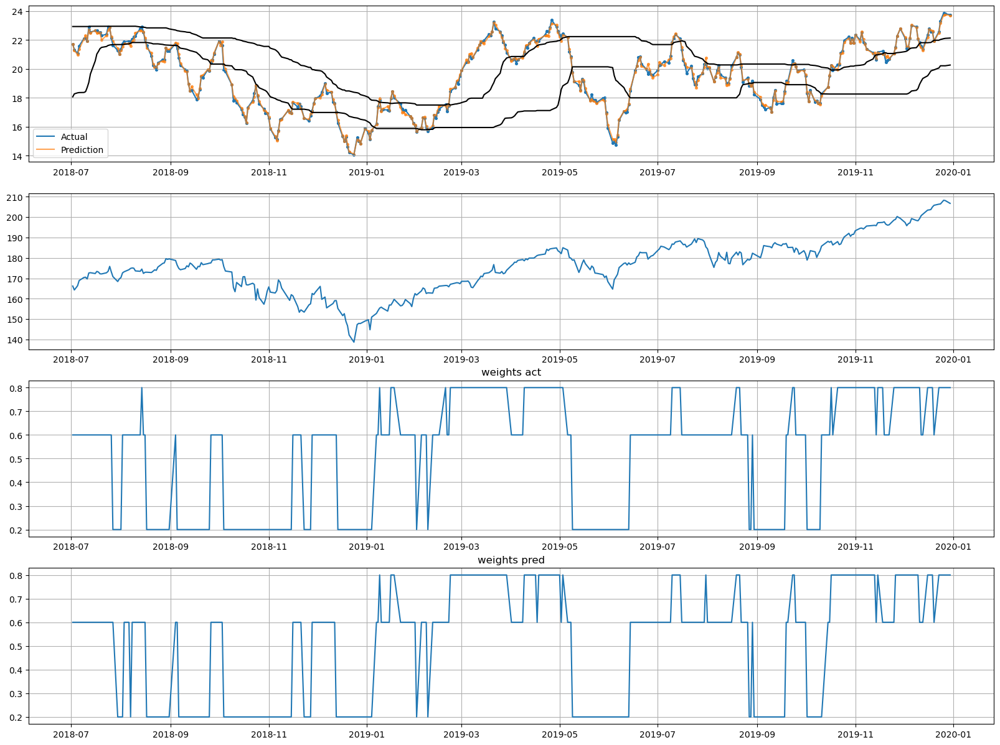

In [193]:
weights_act = test_df_act_10d_ma['w_ndq']
weights_pred = test_df_gb_ma_4['w_ndq']

QQQ_df = price_df.copy()
QQQ_df.set_index('Date', inplace=True)
QQQ_df_weekdays_test = QQQ_df[~QQQ_df.index.isin(QQQ_df.index.difference(portfolio_df_sent_test.index))]



plt.figure(figsize=(20, 15))
plt.subplot(4, 1, 1)
plt.plot(y_test_ma_4, label = 'Actual')
plt.scatter(x=y_test_ma_4.index, y=y_test_ma_4, s=7)
plt.plot(gb_ma_pred_series_4, alpha=0.7, label = 'Prediction')
plt.scatter(x=gb_ma_pred_series_4.index, y=gb_ma_pred_series_4, s=7, alpha=0.7)
plt.plot(upper_gb_ma_4['2018-07-01':], color = 'black')
plt.plot(lower_gb_ma_4['2018-07-01':], color = 'black')
plt.grid(True)
plt.legend()
plt.subplot(4, 1, 2)
plt.plot(QQQ_df_weekdays_test['Adj Close'])
plt.grid(True)

plt.subplot(4, 1, 3)
plt.plot(weights_act)
plt.grid(True)
plt.title('weights act')
plt.subplot(4, 1, 4)
plt.plot(weights_pred)
plt.grid(True)
plt.title('weights pred')

plt.show()

## Sentiment score prediction with several inputs (not the MA!!)

In [48]:
data_df.head()

,Date,r_ndq,r_rf,Volatility,rf_rate,daily_rf,sentiment_score,sentiment_slope,moving_average_10day,close_qqq,adj_close_qqq
0,2015-01-05,-0.014669,0.006101,18.00,0.03,1.200000e-06,18.532825,-1.688521,NaN,101.430000,94.300850
1,2015-01-06,-0.013408,0.006718,19.05,0.03,1.200000e-06,16.950898,-0.425215,NaN,100.070000,93.036430
2,2015-01-07,0.012891,-0.000186,17.20,0.03,1.200000e-06,18.343075,-1.852799,NaN,101.360001,94.235786
3,2015-01-08,0.019140,-0.004079,16.61,0.03,1.200000e-06,21.728897,0.104260,NaN,103.300003,96.039421
4,2015-01-09,-0.006583,0.004933,16.60,0.02,8.000000e-07,19.228589,-2.596250,NaN,102.620003,95.407211


In [51]:
# want to use lagged values of the sentiment and the slope to forecast 1 day ahead sentiment. 
# start with just one lag.

import pandas as pd

# Assuming 'sentiment_slope_df' is already defined and loaded

df = data_df.copy()
df = df.drop(columns=['r_ndq', 'r_rf', 'rf_rate', 'daily_rf', 'adj_close_qqq'])
df.set_index('Date', inplace=True)

orig_features = df.columns

# Create lagged features
for feature in orig_features:
    for lag in range(1, 4):  # 3 lags
        df[f'{feature}_lag_{lag}'] = df[feature].shift(lag)

# Drop rows with NaN values that were created due to lagging
df = df.dropna()

# Split the data into training and testing sets based on the year
train_df_5 = df[:'2018-06-30']
test_df_5 = df['2018-07-01':]

# Prepare features and target variables
# features_ma_4 = [f for f in df.columns if 'lag' in f]
features_5 = [f for f in df.columns if 'lag' in f]
X_train_5 = train_df_5[features_5]
y_train_5 = train_df_5['sentiment_score']

X_test_5 = test_df_5[features_5]
y_test_5 = test_df_5['sentiment_score']


In [53]:
print(X_train_5.shape)
X_train_5.head()

(862, 15)


,Volatility_lag_1,Volatility_lag_2,Volatility_lag_3,sentiment_score_lag_1,sentiment_score_lag_2,sentiment_score_lag_3,sentiment_slope_lag_1,sentiment_slope_lag_2,sentiment_slope_lag_3,moving_average_10day_lag_1,moving_average_10day_lag_2,moving_average_10day_lag_3,close_qqq_lag_1,close_qqq_lag_2,close_qqq_lag_3
Date,,,,,,,,,,,,,,,
2015-01-22,17.35,18.20,19.81,23.748217,24.141814,17.273433,-1.541744,-1.497264,0.544563,19.792475,19.112743,18.551844,102.139999,101.620003,100.820000
2015-01-23,15.66,17.35,18.20,19.969223,23.748217,24.141814,0.099915,-1.541744,-1.497264,19.955090,19.792475,19.112743,104.029999,102.139999,101.620003
2015-01-26,15.47,15.66,17.35,24.099694,19.969223,23.748217,-1.615514,0.099915,-1.541744,20.192170,19.955090,19.792475,104.260002,104.029999,102.139999
2015-01-27,14.76,15.47,15.66,21.159589,24.099694,19.969223,-0.132005,-1.615514,0.099915,20.385270,20.192170,19.955090,104.139999,104.260002,104.029999
2015-01-28,16.70,14.76,15.47,18.867201,21.159589,24.099694,0.731719,-0.132005,-1.615514,20.468942,20.385270,20.192170,101.440002,104.139999,104.260002


In [55]:
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

# Models to be used
models = {
    "Random Forest": RandomForestRegressor(random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(random_state=42)
}

# Hyperparameters for tuning (simplified for rolling window example)
parameters = {
    "Random Forest": {'n_estimators': 140, 'max_depth': 4, 'min_samples_leaf' : 4},
    "Gradient Boosting": {'n_estimators': 140, 'max_depth': 4, 'learning_rate': 0.1, 'min_samples_leaf' : 4}
    # "Gradient Boosting": {'n_estimators': 98, 'max_depth': 2, 'learning_rate': 0.23333333333333334} # not better than current one
}

# Initialize dictionaries to store results
model_performance_5 = {}
model_predictions_5 = {}

# Create test and train data set with date index
X_train_idx = X_train_5.copy()
# X_train_idx.set_index()
y_train_idx = pd.DataFrame(y_train_5).copy()

X_test_idx = X_test_5.copy()
y_test_idx = pd.DataFrame(y_test_5).copy()

# Implementing rolling window forecasting
for model_name in models:
    print('Model:  ', model_name)
    model = models[model_name]
    params = parameters[model_name]

    # Initialize storage for predictions and actuals
    predictions = []
    feature_importances = []
    # actuals = y_test_idx
    #print(actuals.head())

    # Start rolling window forecast
    for i in X_test_idx.index:

        # Scale x train:
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train_idx)
        X_train_scaled_df = pd.DataFrame(X_train_scaled, columns = X_train_idx.columns)
        model.set_params(**params)
        # model.fit(X_train_scaled_df, y_train_idx)
        model.fit(X_train_scaled_df, y_train_idx.values.ravel())


        # Obtain feature importance
        importance = model.feature_importances_
        feature_importances.append(importance)

        # Scale x test for the current point:
        X_test_scaled = scaler.transform(X_test_idx.loc[[i]])
        X_test_scaled_df = pd.DataFrame(X_test_scaled, columns = X_test_idx.columns)
    
        # Make a prediction for the next point
        next_point_prediction = model.predict(X_test_scaled_df)
        predictions.append(next_point_prediction[0])

        # Rolling feature window
        # X_test_to_train = pd.Series([X_test[i]], index=[i])
        X_test_to_train = X_test_idx.loc[[i]]
        print(X_test_to_train)
        X_train_idx = pd.concat([X_train_idx, X_test_to_train])
        X_train_idx = X_train_idx.iloc[1:]

        # Rolling target variable window
        y_test_to_train = y_test_idx.loc[[i]]
        print(y_test_to_train)
        y_train_idx = pd.concat([y_train_idx, y_test_to_train])
        y_train_idx = y_train_idx.iloc[1:]
    
    # Calculate performance metrics
    rmse = np.sqrt(mean_squared_error(y_test_5, predictions))
    r2 = r2_score(y_test_5, predictions)

    # Store results
    model_performance_5[model_name] = {'RMSE': rmse, 'R2': r2}
    model_predictions_5[model_name] = {'y_pred': predictions, 'feature_importance': feature_importances}

# Output model performance
print(model_performance_5)


Model:   Random Forest
            Volatility_lag_1  Volatility_lag_2  Volatility_lag_3  \
Date                                                               
2018-07-02             19.26             20.06             19.67   

            sentiment_score_lag_1  sentiment_score_lag_2  \
Date                                                       
2018-07-02              19.547577               26.27854   

            sentiment_score_lag_3  sentiment_slope_lag_1  \
Date                                                       
2018-07-02              19.477187               -1.91969   

            sentiment_slope_lag_2  sentiment_slope_lag_3  \
Date                                                       
2018-07-02               1.807002              -0.789443   

            moving_average_10day_lag_1  moving_average_10day_lag_2  \
Date                                                                 
2018-07-02                   21.650982                   21.660855   

            moving

Results:

"Random Forest": {'n_estimators': 90, 'max_depth': 3, 'min_samples_leaf' : 4},
"Gradient Boosting": {'n_estimators': 140, 'max_depth': 4, 'learning_rate': 0.1, 'min_samples_leaf' : 4}

{'Random Forest': {'RMSE': 3.652036339942163, 'R2': 0.15507148445926522}, 'Gradient Boosting': {'RMSE': 1.6681479615280361, 'R2': 0.8237135529766554}}


In [56]:
gb_feature_importance_5 = model_predictions_5['Gradient Boosting']['feature_importance']
gb_feature_importance_avg_5 = np.mean(gb_feature_importance_5, axis=0)


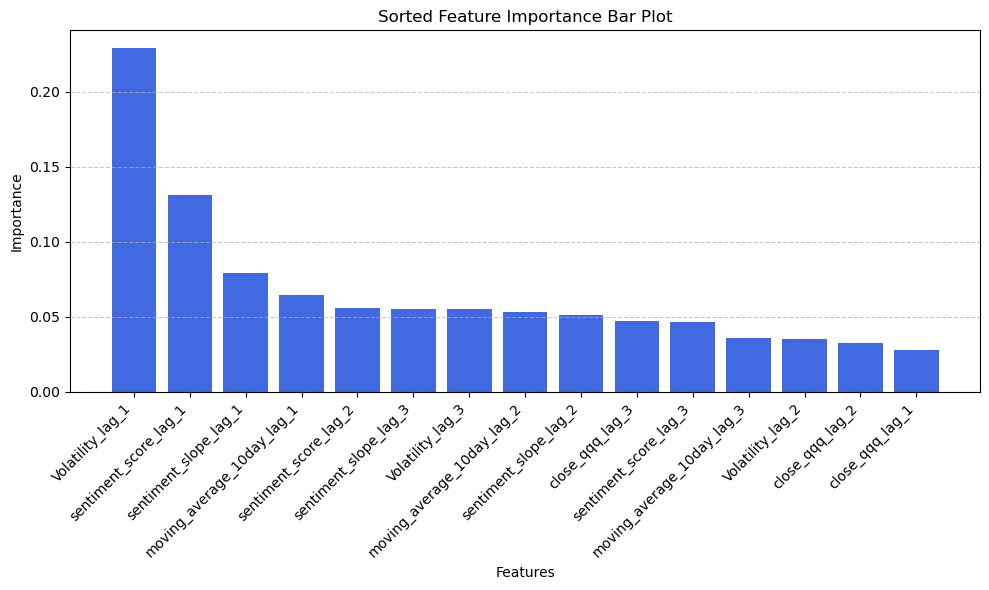

In [57]:
# Assuming that `gb_feature_importance_avg_2` contains the importance scores in the same order as `labels`
labels = X_train_idx.columns
# Combine labels and importance scores into a list of tuples
feature_importance = list(zip(labels, gb_feature_importance_avg_5))

# Sort the list of tuples by importance scores in descending order
sorted_features = sorted(feature_importance, key=lambda x: x[1], reverse=True)

# Extract sorted features and their corresponding scores
sorted_labels, sorted_importances = zip(*sorted_features)

# Plot the sorted features as a bar plot
plt.figure(figsize=(10, 6))
plt.bar(sorted_labels, sorted_importances, color='royalblue')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Sorted Feature Importance Bar Plot')
plt.xticks(rotation=45, ha="right")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [70]:
gb_predictions_5 = model_predictions_5['Gradient Boosting']['y_pred']
len(gb_predictions_5)
gb_pred_series_5 = pd.Series(gb_predictions_5)
gb_pred_series_5.index = pd.to_datetime(X_test_5.index)

# 0.25/75, 1.23, 54 trading days / 0.33/66, many inputs
sharpe_gb_5, df_calc_gb_5, test_df_gb_5, upper_gb_5, lower_gb_5 = sharpe_correct(gb_pred_series_5, 'sentiment_score')
print(sharpe_gb_5)
print(test_df_gb_5['trading day'].sum())


# 0.25/75, 2.45, 262 trading days, 0.4 alpha / 0.25/75, 1.72, 157 trading days, 0.9 alpha / 
sharpe_gb_5_exp, df_calc_gb_5_exp, test_df_gb_5_exp, upper_gb_5_exp, lower_gb_5_exp = sharpe_correct_exp_disc(gb_pred_series_5, 'sentiment_score')
print(sharpe_gb_5_exp)
print(test_df_gb_5_exp['trading day'].sum())

372    1.388236
Name: portfolio_value, dtype: object
138
372    1.726816
Name: portfolio_value, dtype: object
157


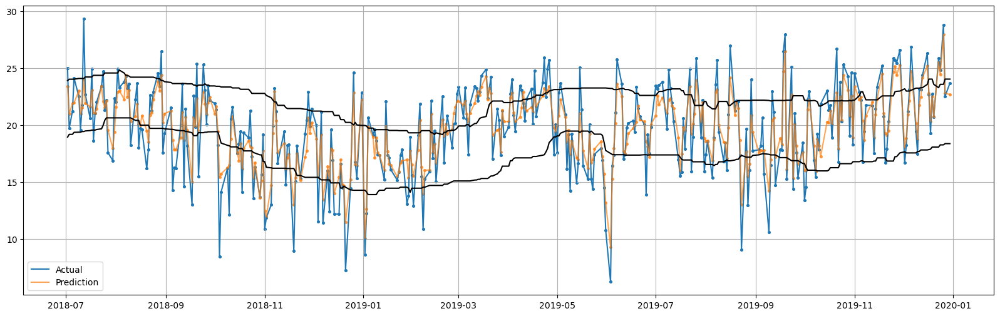

In [62]:
plt.figure(figsize=(20, 6))
plt.plot(y_test_5, label = 'Actual')
plt.scatter(x=y_test_5.index, y=y_test_5, s=7)
plt.plot(gb_pred_series_5, alpha=0.7, label = 'Prediction')
plt.scatter(x=gb_pred_series_5.index, y=gb_pred_series_5, s=7, alpha=0.7)
plt.plot(upper_gb_5['2018-07-01':], color = 'black')
plt.plot(lower_gb_5['2018-07-01':], color = 'black')
plt.grid(True)
plt.legend()
plt.show()

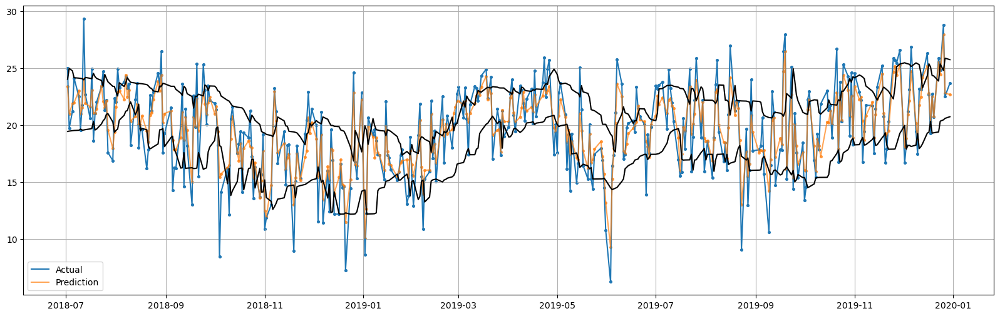

In [71]:
plt.figure(figsize=(20, 6))
plt.plot(y_test_5, label = 'Actual')
plt.scatter(x=y_test_5.index, y=y_test_5, s=7)
plt.plot(gb_pred_series_5, alpha=0.7, label = 'Prediction')
plt.scatter(x=gb_pred_series_5.index, y=gb_pred_series_5, s=7, alpha=0.7)
plt.plot(upper_gb_5_exp['2018-07-01':], color = 'black')
plt.plot(lower_gb_5_exp['2018-07-01':], color = 'black')
plt.grid(True)
plt.legend()
plt.show()

--------------------------

using just the lag of the sentiment gives 0.1798...

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

gb_model = GradientBoostingRegressor(n_estimators=200, learning_rate=0.1, random_state=42)
gb_model.fit(X_train, y_train)

GradientBoostingRegressor(n_estimators=200, random_state=42)

In [ ]:
import xgboost as xgb

xgb_model = xgb.XGBRegressor(n_estimators=250, learning_rate=0.1, random_state=42)
xgb_model.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=250, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [ ]:
from sklearn.metrics import mean_squared_error

# Predictions
rf_predictions = rf_best_model.predict(X_test)
gb_predictions = gb_model.predict(X_test)
xgb_predictions = xgb_model.predict(X_test)

# Evaluation using RMSE
rf_rmse = mean_squared_error(y_test, rf_predictions, squared=False)
gb_rmse = mean_squared_error(y_test, gb_predictions, squared=False)
xgb_rmse = mean_squared_error(y_test, xgb_predictions, squared=False)

#evaluation using r2:
rf_r2 = r2_score(y_test, rf_predictions)
gb_r2 = r2_score(y_test, gb_predictions)
xgb_r2 = r2_score(y_test, xgb_predictions)
print("Random Forest RMSE:", rf_rmse, "R2:", rf_r2)
print("Gradient Boosting RMSE:", gb_rmse, "R2:", gb_r2)
print("XGBoost RMSE:", xgb_rmse, "R2:", xgb_r2)

Gradient Boosting RMSE: 3.7773874359925133 R2: 0.04596733822792576
XGBoost RMSE: 3.9552186889266165 R2: -0.04597470647034729


<BarContainer object of 6 artists>

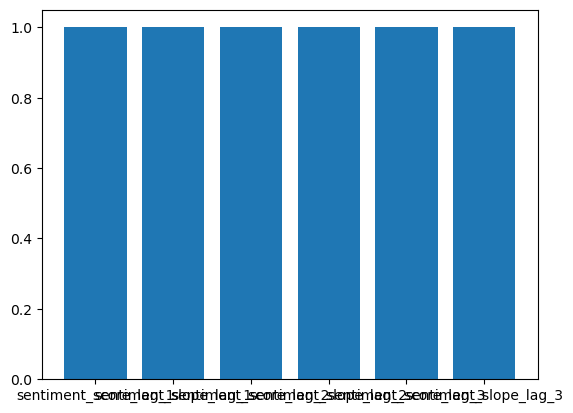

In [ ]:
plt.bar(X_train.columns, rf_model.feature_importances_)

In [ ]:
url1 = 'https://raw.githubusercontent.com/inga-maria01/master_thesis/main/data/model_data_no_sentiment.csv'

df = pd.read_csv(url1)
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
df.head()

,Unnamed: 0,Volatility,stock_returns,stock_volume,US_log_inflation,US_interest_rate,consumer_barometer,Volatility_lag1,stock_returns_lag1,stock_volume_lag1,US_log_inflation_lag1,US_interest_rate_lag1,consumer_barometer_lag1
Date,,,,,,,,,,,,,
2015-01-06,1254,19.05,-1.340836,66205500,-0.639069,0.75,0.353886,18.00,-1.466868,36521300.0,-0.639069,0.75,0.353886
2015-01-07,1253,17.20,1.289125,37577400,-0.639069,0.75,0.353886,19.05,-1.340836,66205500.0,-0.639069,0.75,0.353886
2015-01-08,1252,16.61,1.913960,40212600,-0.639069,0.75,0.353886,17.20,1.289125,37577400.0,-0.639069,0.75,0.353886
2015-01-09,1251,16.60,-0.658282,41410100,-0.639069,0.75,0.353886,16.61,1.913960,40212600.0,-0.639069,0.75,0.353886
2015-01-12,1250,17.88,-1.042701,34129800,-0.639069,0.75,0.353886,16.60,-0.658282,41410100.0,-0.639069,0.75,0.353886


In [ ]:
df2 = pd.merge(sentiment_index_df, df[['Volatility_lag1']], on = 'Date', how = 'inner')

In [ ]:
#df2 = pd.merge(df2, sentiment_slope_df['sentiment_slope'], on = 'Date', how = 'inner')

In [ ]:
df2['slope_lag'] = df2['sentiment_slope'].shift(1)

In [ ]:
df2.head()

,sentiment_score,sentiment_slope,lag_sentiment,Volatility_lag1,slope_lag
Date,,,,,
2015-01-06,17.394480,-0.425215,17.779190,18.00,NaN
2015-01-07,18.581044,-1.852799,17.394480,19.05,-0.425215
2015-01-08,21.686393,0.104260,18.581044,17.20,-1.852799
2015-01-09,19.543640,-2.596250,21.686393,16.61,0.104260
2015-01-12,15.939740,0.376702,18.854202,16.60,-2.596250


In [ ]:
# Split the data into training and testing sets based on the year
train_df = df2[:'2018-06-30']
train_df.dropna(inplace=True)
test_df = df2['2018-07-01':]

# Prepare features and target variables
X_train = train_df[['lag_sentiment', 'Volatility_lag1', 'slope_lag']]
y_train = train_df['sentiment_score']

X_test = test_df[['lag_sentiment', 'Volatility_lag1', 'slope_lag']]
y_test = test_df['sentiment_score']



Epoch 1/50
14/14 [==============================] - 3s 3ms/step - loss: 224.3414
Epoch 2/50
14/14 [==============================] - 0s 2ms/step - loss: 91.7647
Epoch 3/50
14/14 [==============================] - 0s 3ms/step - loss: 71.8220
Epoch 4/50
14/14 [==============================] - 0s 2ms/step - loss: 60.3864
Epoch 5/50
14/14 [==============================] - 0s 2ms/step - loss: 56.8119
Epoch 6/50
14/14 [==============================] - 0s 3ms/step - loss: 53.4989
Epoch 7/50
14/14 [==============================] - 0s 2ms/step - loss: 42.8714
Epoch 8/50
14/14 [==============================] - 0s 2ms/step - loss: 41.7165
Epoch 9/50
14/14 [==============================] - 0s 3ms/step - loss: 36.9349
Epoch 10/50
14/14 [==============================] - 0s 3ms/step - loss: 34.6323
Epoch 11/50
14/14 [==============================] - 0s 3ms/step - loss: 31.9188
Epoch 12/50
14/14 [==============================] - 0s 2ms/step - loss: 29.8471
Epoch 13/50
14/14 [=================

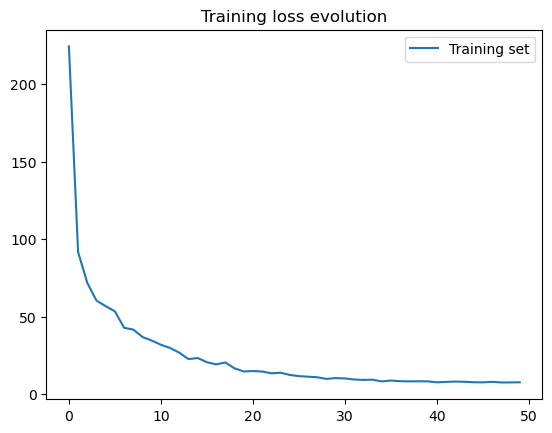

12/12 [==============================] - 0s 2ms/step
RMSE: 3.9464837217970024 R2: 0.0540351413947775


In [ ]:
#Try RNN:
import numpy as np
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers.legacy import Adam
import keras

# Assume X_train, y_train, X_test, y_test are already defined

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Reshape input to be [samples, time steps, features]
X_train_scaled = X_train_scaled.reshape((X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
X_test_scaled = X_test_scaled.reshape((X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

# Build the LSTM model
model = Sequential()
model.add(LSTM(16, activation='relu', input_shape=(X_train_scaled.shape[1], X_train_scaled.shape[2]), return_sequences = True))
model.add(LSTM(4, return_sequences = False))
#model.add(Dense(64, activation='linear'))
model.add(Dense(16, activation='relu'))
model.add(Dense(8, activation='relu'))
model.add(Dropout(0.5))
#model.add(Dense(8, activation='tanh'))
model.add(Dense(1))
model.compile(optimizer='SGD', loss='mean_squared_error')

# Fit the model
history = model.fit(X_train_scaled, y_train, epochs=50, batch_size=64, verbose=1)

plt.plot(history.history['loss'])
plt.title("Training loss evolution")
plt.legend(["Training set"])
plt.show()

# Evaluate the model
y_pred = model.predict(X_test_scaled)
rmse_rnn = np.sqrt(mean_squared_error(y_test, y_pred))
r2_rnn = r2_score(y_test, y_pred)
print('RMSE:', rmse_rnn, 'R2:', r2_rnn)


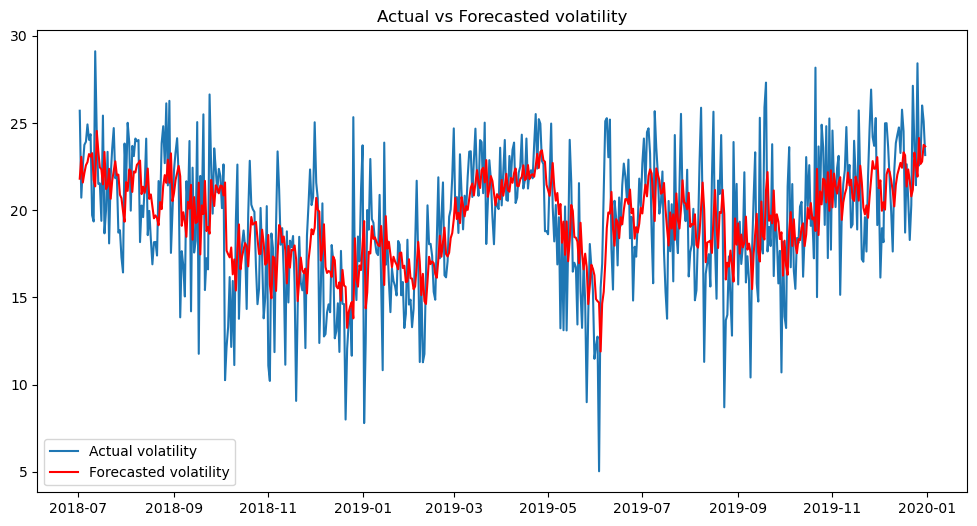

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from arch.__future__ import reindexing
from arch import arch_model

volatility = sentiment_slope_df['sentiment_score']
# Set the training window size
train_size = len(sentiment_slope_df[:'2018-07-01'])

# Set forecast horizon
forecast_horizon = 1

# Initialize lists to store forecasts
mean_forecasts = []
variance_forecasts = []

for i in range(train_size, len(volatility)):
    # Training data for current window
    train_data = volatility[:i]

    # ARIMA model for mean
    arima_model = ARIMA(train_data, order=(2,0,1)) #data has ar(1) structure if we look at acf and pacf
    arima_result = arima_model.fit()
    mean_forecast = arima_result.forecast(steps=forecast_horizon)[0] # [0] to get just the value

    # GARCH model for variance
    garch_model = arch_model(train_data, vol='Garch', p=2, q=1)
    garch_result = garch_model.fit(disp='off')
    variance_forecast = garch_result.forecast(horizon=forecast_horizon).variance.values[-1, :][0]

    # Store forecasts
    mean_forecasts.append(mean_forecast)
    variance_forecasts.append(variance_forecast)

# Convert forecasts to Series for further analysis or plotting
mean_forecast_series = pd.Series(mean_forecasts, index=volatility.index[train_size:])
variance_forecast_series = pd.Series(variance_forecasts, index=volatility.index[train_size:])

# Plot the actual returns vs forecasted returns
plt.figure(figsize=(12, 6))
plt.plot(volatility.index[train_size:], volatility[train_size:], label='Actual volatility')
plt.plot(mean_forecast_series.index, mean_forecast_series, color='red', label='Forecasted volatility')
plt.legend()
plt.title('Actual vs Forecasted volatility')
plt.show()

In [ ]:
r2_score(volatility[train_size:], mean_forecasts)

0.26588968117015355

In [ ]:
mean_forecasts = pd.Series(mean_forecasts)
mean_forecasts.index = sentiment_slope_df['2018-07-02':].index

In [ ]:
mean_forecasts

Date
2018-07-02    21.809575
2018-07-03    23.064867
2018-07-04    21.591245
2018-07-05    22.133131
2018-07-06    22.581885
                ...    
2019-12-27    24.143115
2019-12-28    22.655225
2019-12-29    22.795255
2019-12-30    23.748458
2019-12-31    23.663034
Length: 548, dtype: float64

In [ ]:
portfolio_df_sent

,r_ndq,r_rf,Volatility,rf_rate,sentiment_score,sentiment_slope,lag_sentiment,moving_average_10day
Date,,,,,,,,
2015-01-05,-0.014669,0.006101,18.00,1.190476e-06,17.779190,-1.688521,16.774633,NaN
2015-01-06,-0.013408,0.006718,19.05,1.190476e-06,17.394480,-0.425215,17.779190,NaN
2015-01-07,0.012891,-0.000186,17.20,1.190476e-06,18.581044,-1.852799,17.394480,NaN
2015-01-08,0.019140,-0.004079,16.61,1.190476e-06,21.686393,0.104260,18.581044,NaN
2015-01-09,-0.006583,0.004933,16.60,7.936508e-07,19.543640,-2.596250,21.686393,NaN
...,...,...,...,...,...,...,...,...
2019-12-23,0.002641,-0.000906,12.34,6.309524e-05,27.140579,-0.659049,20.300683,22.753680
2019-12-24,0.000519,0.001724,12.36,6.269841e-05,23.723393,-2.178170,27.140579,23.362800
2019-12-26,0.008824,0.001450,12.58,6.269841e-05,28.429432,1.745469,21.436675,23.977012


In [ ]:
forecasts = pd.merge(mean_forecasts.rename('forecast'), portfolio_df_sent['sentiment_score'], on ='Date', how = 'inner')

In [ ]:
forecasts

,forecast,sentiment_score
Date,,
2018-07-02,21.809575,25.709066
2018-07-03,23.064867,20.722385
2018-07-05,22.133131,23.749679
2018-07-06,22.581885,23.930714
2018-07-09,23.078901,24.359113
...,...,...
2019-12-23,21.172894,27.140579
2019-12-24,23.306834,23.723393
2019-12-26,21.929082,28.429432


In [ ]:
shapre, upper, lower = overall_sharpe_sentiment_prec_exp(forecasts['forecast'])

In [ ]:
portfolio_df_sent_test['trading day'].sum()

177

In [ ]:
shapre

0.06931628509559509

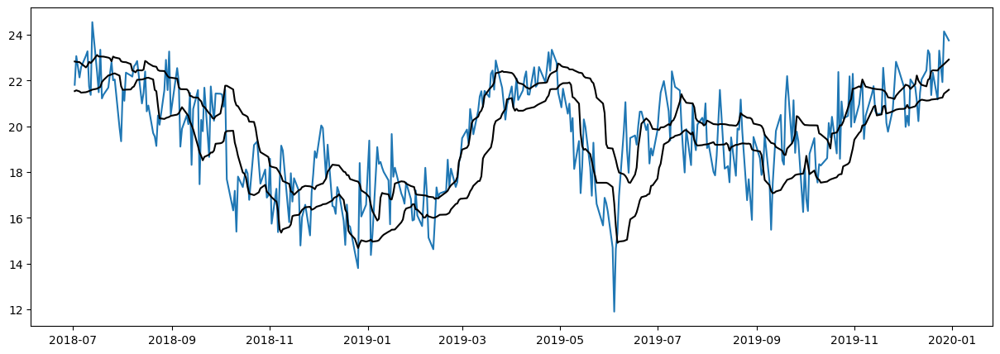

In [ ]:
plt.figure(figsize=(15,5))
plt.plot(forecasts['forecast'])
plt.plot(upper['2018-07-01':], color = 'black')
plt.plot(lower['2018-07-01':], color = 'black')

In [ ]:
mean_forecasts

[2017-05-30    24.646049
 Freq: D, dtype: float64,
 2017-05-31    23.853848
 Freq: D, dtype: float64,
 2017-06-01    22.85916
 Freq: D, dtype: float64,
 2017-06-02    23.286371
 Freq: D, dtype: float64,
 2017-06-03    24.861301
 Freq: D, dtype: float64,
 2017-06-04    24.408137
 Freq: D, dtype: float64,
 2017-06-05    23.230174
 Freq: D, dtype: float64,
 2017-06-06    23.690291
 Freq: D, dtype: float64,
 2017-06-07    23.343818
 Freq: D, dtype: float64,
 2017-06-08    22.626376
 Freq: D, dtype: float64,
 2017-06-09    24.261158
 Freq: D, dtype: float64,
 2017-06-10    21.241555
 Freq: D, dtype: float64,
 2017-06-11    21.578721
 Freq: D, dtype: float64,
 2017-06-12    21.464275
 Freq: D, dtype: float64,
 2017-06-13    20.394028
 Freq: D, dtype: float64,
 2017-06-14    21.677018
 Freq: D, dtype: float64,
 2017-06-15    21.725826
 Freq: D, dtype: float64,
 2017-06-16    20.986954
 Freq: D, dtype: float64,
 2017-06-17    20.802073
 Freq: D, dtype: float64,
 2017-06-18    20.471495
 Freq: 

In [ ]:
url_nasdaq_price = 'https://raw.githubusercontent.com/inga-maria01/master_thesis/main/data/QQQ.csv'
price_df = pd.read_csv(url_nasdaq_price)
price_df['Date'] = pd.to_datetime(price_df['Date'])
price_df.set_index('Date', inplace=True)
price_df.head()
#this dataset includes the prices and the volume!
# we now need to calculate the returns, do this by taking the logarithm and first difference of the closing price.


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2015-01-02,103.760002,104.199997,102.440002,102.940002,95.704712,31314600
2015-01-05,102.489998,102.610001,101.139999,101.430000,94.300850,36521300
2015-01-06,101.580002,101.750000,99.620003,100.070000,93.036430,66205500
2015-01-07,100.730003,101.599998,100.489998,101.360001,94.235786,37577400
2015-01-08,102.220001,103.500000,102.110001,103.300003,96.039421,40212600


In [ ]:
df2 = pd.merge(df2, price_df['Adj Close'], on = 'Date', how = 'inner')

In [ ]:
# Split the data into training and testing sets based on the year
train_df = df2[df2.index.year < 2019]
train_df.dropna(inplace=True)
test_df = df2[df2.index.year == 2019]

# Prepare features and target variables
X_train = train_df[['lag_sentiment', 'Volatility_lag1', 'slope_lag', 'Adj Close']]
y_train = train_df['sentiment_score']

X_test = test_df[['lag_sentiment', 'Volatility_lag1', 'slope_lag', 'Adj Close']]
y_test = test_df['sentiment_score']



-----------------------------------------------------------------------------

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np

# Step 1: Fit an ARIMA model
# Assume `time_series` is your time series data
arima_model = ARIMA(y_train, order=(2,0,1))
arima_result = arima_model.fit()

# Step 2: Compute residuals
arima_residuals = y_train - arima_result.fittedvalues

# Step 3: Train a machine learning model on the residuals
# For this example, we'll use a lag of 1 for simplicity
X = arima_residuals.shift(1).dropna()
y = arima_residuals[1:]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train.values.reshape(-1, 1), y_train)

# Step 4: Use the ARIMA model to forecast and then adjust using the ML model
arima_forecast = arima_result.forecast(steps=1)
ml_adjustment = rf_model.predict(np.array(arima_forecast - arima_result.fittedvalues.iloc[-1]).reshape(-1, 1))

# The final forecast is the combination of the ARIMA forecast and the ML adjustment
final_forecast = arima_forecast + ml_adjustment

# `final_forecast` is your hybrid model forecast


In [ ]:
final_forecast

1003    18.934332
dtype: float64

In [ ]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

# Assuming you have a pandas DataFrame `df` with your time series data in a column named 'value'

# Data preprocessing
# Scale data to be between 0 and 1
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(df2['sentiment_score'].values.reshape(-1, 1))

# Create a dataset where X is the number of past days you want to use to predict the future
def create_dataset(data, time_step=1):
    X, y = [], []
    for i in range(len(data) - time_step - 1):
        a = data[i:(i + time_step), 0]
        X.append(a)
        y.append(data[i + time_step, 0])
    return np.array(X), np.array(y)

time_step = 30 # number of past days you want to use to predict the future
X, y = create_dataset(scaled_data, time_step)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Reshape input to be [samples, time steps, features] which is required for LSTM
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)

# Build the LSTM model
model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(time_step, 1)))
model.add(LSTM(50, return_sequences=False))
model.add(Dense(25))
model.add(Dropout(0.5))
model.add(Dense(1))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, batch_size=16, epochs=20, verbose=1)

# Predicting and inverse transforming the scaled data
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Inverse-scaling to get actual values
train_predict = scaler.inverse_transform(train_predict)
test_predict = scaler.inverse_transform(test_predict)

# Use `test_predict` for evaluation and plotting your predictions


Epoch 1/20
62/62 [==============================] - 4s 15ms/step - loss: 0.0513
Epoch 2/20
62/62 [==============================] - 1s 16ms/step - loss: 0.0230
Epoch 3/20
62/62 [==============================] - 1s 15ms/step - loss: 0.0192
Epoch 4/20
62/62 [==============================] - 1s 15ms/step - loss: 0.0162
Epoch 5/20
62/62 [==============================] - 1s 15ms/step - loss: 0.0152
Epoch 6/20
62/62 [==============================] - 1s 16ms/step - loss: 0.0142
Epoch 7/20
62/62 [==============================] - 1s 17ms/step - loss: 0.0141
Epoch 8/20
62/62 [==============================] - 1s 15ms/step - loss: 0.0127
Epoch 9/20
62/62 [==============================] - 1s 15ms/step - loss: 0.0130
Epoch 10/20
62/62 [==============================] - 1s 16ms/step - loss: 0.0127
Epoch 11/20
62/62 [==============================] - 1s 15ms/step - loss: 0.0125
Epoch 12/20
62/62 [==============================] - 1s 16ms/step - loss: 0.0126
Epoch 13/20
62/62 [==================

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

# Assume `y_test` are the true values and `test_predict` are the model's predictions
# Note: `y_test` and `test_predict` should be in the original scale (if scaling was applied)

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_test, test_predict))
print(f'RMSE: {rmse}')

# Calculate R²
r2 = r2_score(y_test, test_predict)
print(f'R²: {r2}')


RMSE: 20.360240414521222
R²: -19116.12220691253


------------------------------------------------------
Modeling with the 10 day moving average

In [ ]:
import warnings
from statsmodels.tsa.arima.model import ARIMA

# Ignore all warnings
warnings.filterwarnings("ignore")

# Determine optimal lag value with AIC and BIC for ARMA

# AIC
aic_values_arma = []

max_lag = 4

# Fit ARMA models with different lag orders
for p in range(0, max_lag + 1):
    for q in range(0, max_lag + 1):
        model_arma = ARIMA(portfolio_df_sent['moving_average_10day'].dropna(), order=(p, 0, q))  # (p, d, q) for ARMA model
        results_arma = model_arma.fit()
        aic_values_arma.append((p, q, results_arma.aic))

# Find the lag orders with the lowest AIC
optimal_lag_aic_arma = min(aic_values_arma, key=lambda x: x[2])  # Minimum AIC tuple
print("Optimal lag orders based on AIC for ARMA model:", optimal_lag_aic_arma)

# BIC
bic_values_arma = []

# Fit ARMA models with different lag orders
for p in range(0, max_lag + 1):
    for q in range(0, max_lag + 1):
        model_arma = ARIMA(portfolio_df_sent['moving_average_10day'].dropna(), order=(p, 0, q))
        results_arma = model_arma.fit()
        bic_values_arma.append((p, q, results_arma.bic))

# Find the lag orders with the lowest BIC
optimal_lag_bic_arma = min(bic_values_arma, key=lambda x: x[2])  # Minimum BIC tuple
print("Optimal lag orders based on BIC for ARMA model:", optimal_lag_bic_arma)

Optimal lag orders based on AIC for ARMA model: (3, 4, 1071.383092297266)
Optimal lag orders based on BIC for ARMA model: (3, 4, 1117.474364376467)


In [ ]:

# Rolling window (window size is 80% of data)

import warnings

# Ignore all warnings
warnings.filterwarnings("ignore")


# Initialize lists to store MSE values and forecasts
res_list = []
forecast_list = []
conf = []

#initial training and test sets:
#train_data = y_train.copy() # ['sentiment_score'].copy()
#test_data = y_test.copy() #sentiment_df_test['sentiment_score'].copy()
train_data = portfolio_df_sent[:'2018-07-01']['moving_average_10day'].dropna().copy()
test_data = portfolio_df_sent['2018-07-01':]['moving_average_10day'].copy()

for i in test_data.index:
    #print(len(train_data))
    # model = AutoReg(train_data, lags=optimal_lag_bic) # optimal lag = 10
    model = ARIMA(train_data, order=(3, 0, 4))
    model_fit = model.fit()

    #forecast = model_fit.predict(start=len(train_data), end=len(train_data))
    # forecast = model_fit.forecast(steps=1)
    get_forecast = model_fit.get_forecast(steps=1)

    forecast = get_forecast.predicted_mean
    forecast_conf = get_forecast.conf_int(alpha=0.05)

    #print(len(forecast))

    #print(forecast)
    forecast_list.append(forecast)
    conf.append(forecast_conf)

    #print(test_data[i])

    res = test_data[i] - forecast
    res_list.append(res)

    # Expand estimation window
    test_to_train = pd.Series([test_data[i]], index=[i])
    #print(test_to_train)
    train_data = pd.concat([train_data, test_to_train])
    train_data = train_data.iloc[1:]
    #print(len(train_data))


    #print(train_data[-5:])

# Calculate the overall average MSE
mse = np.mean(np.square(res))
print("Overall average MSE:", mse)

Overall average MSE: 0.03706717893845573


In [ ]:
#calculate RMSE and R2:
rmse = np.sqrt(mean_squared_error(test_data, forecast_list))
r2 = r2_score(test_data, forecast_list)
print("RMSE:", rmse, "R2:", r2)

RMSE: 0.4689340645311972 R2: 0.9576028000237256


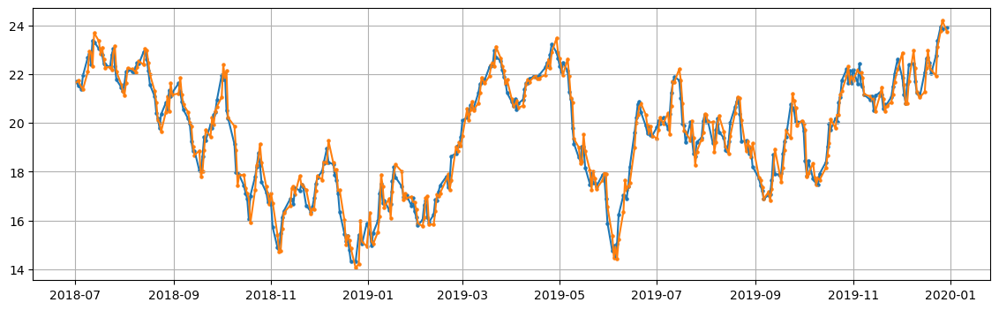

In [ ]:
plt.figure(figsize=(14,4))
plt.plot(test_data)
plt.scatter(test_data.index, test_data, s = 5)
plt.plot(test_data.index, forecast_list)
plt.scatter(test_data.index, forecast_list, s = 5)
plt.grid(True)

In [ ]:
# Extract numeric values from each Series in the list
values = [s.iloc[0] for s in forecast_list]  # `s.iloc[0]` accesses the first value in each Series

In [ ]:

# Create a new Series from the list of values
forecast_series = pd.Series(values)
forecast_series.index = test_data.index

In [ ]:
sharpe, upper, lower = overall_sharpe_sentiment_prec_exp(forecast_series[~forecast_series.index.isin(forecast_series.index.difference(portfolio_df_sent_test.index))])

In [ ]:
sharpe

0.062391011413650437

In [ ]:
overall_sharpe_sentiment_prec_exp(portfolio_df_sent_test['moving_average_10day'])[0]

0.14001041657537563

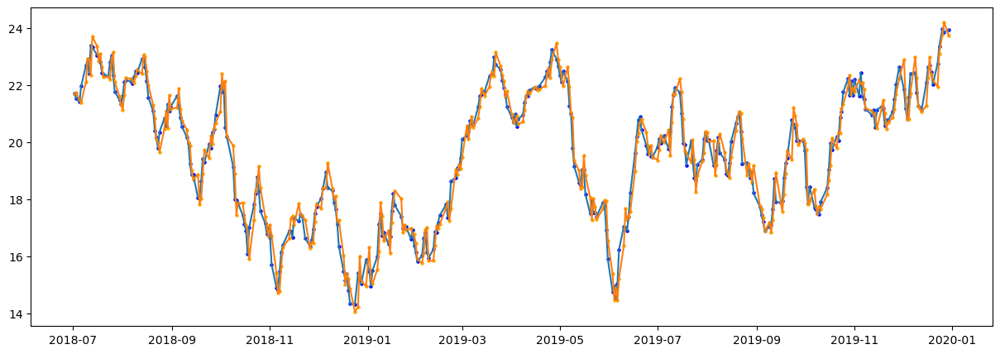

In [ ]:
plt.figure(figsize=(15,5))
plt.plot(portfolio_df_sent_test['moving_average_10day'])
plt.scatter(portfolio_df_sent_test.index, portfolio_df_sent_test['moving_average_10day'], s = 5, color = 'blue')
plt.plot(forecast_series)
plt.scatter(portfolio_df_sent_test.index, forecast_series, s = 5, color = 'orange')
#plt.plot(upper['2018-07-01':], color = 'black')
#plt.plot(lower['2018-07-01':], color = 'black')

In [ ]:
mean_squared_error(portfolio_df_sent_test['moving_average_10day'], forecast_series)

0.219899156877749

In [ ]:
r2_score(portfolio_df_sent_test['moving_average_10day'], forecast_series)

0.9576028000237256

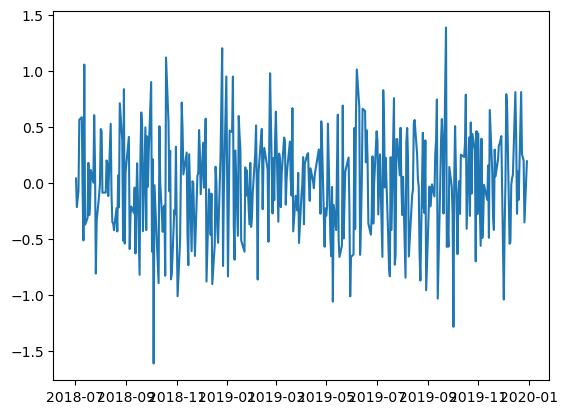

In [ ]:
plt.plot(portfolio_df_sent_test['moving_average_10day'] - forecast_series)

In [ ]:
residuals = portfolio_df_sent_test['moving_average_10day'] - forecast_series

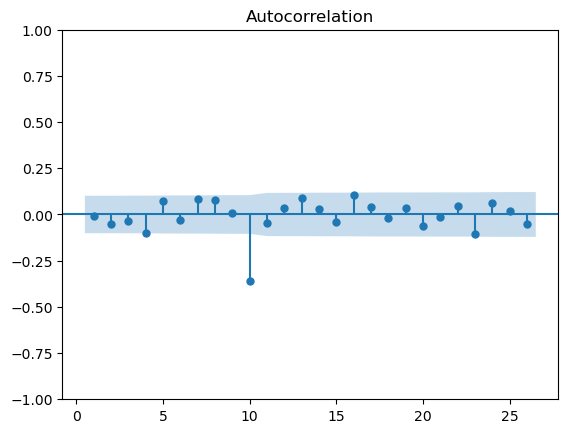

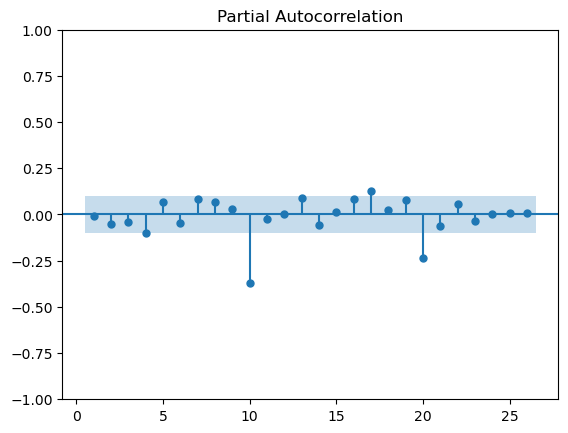

In [ ]:
plot_acf(residuals, zero=False)
plt.show()
plot_pacf(residuals, zero=False)
plt.show()

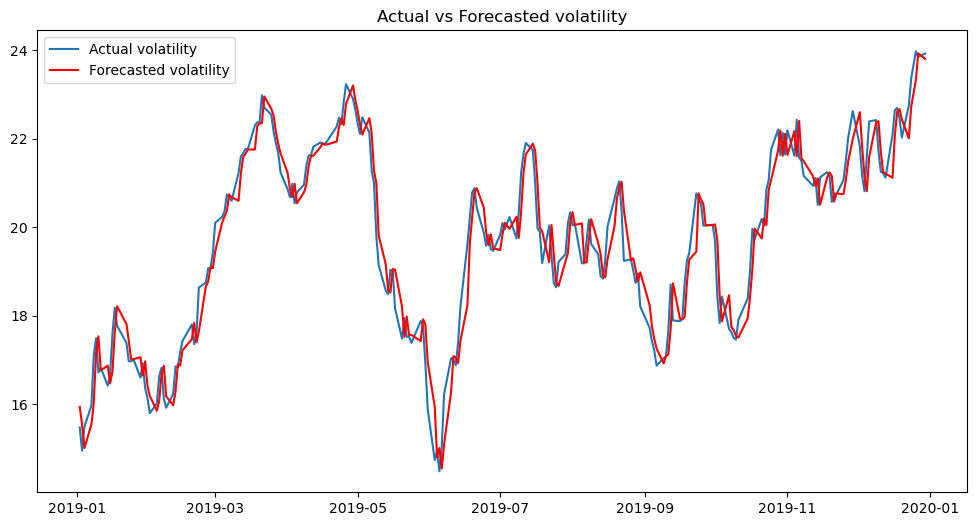

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from arch.__future__ import reindexing
from arch import arch_model

volatility = portfolio_df_sent['moving_average_10day'].dropna()
# Set the training window size
train_size = len(portfolio_df_sent_train['moving_average_10day'].dropna())

# Set forecast horizon
forecast_horizon = 1

# Initialize lists to store forecasts
mean_forecasts = []
variance_forecasts = []

for i in range(train_size, len(volatility)):
    # Training data for current window
    train_data = volatility[:i]

    # ARIMA model for mean
    arima_model = ARIMA(train_data, order=(3,0,4)) #data has ar(1) structure if we look at acf and pacf
    arima_result = arima_model.fit()
    mean_forecast = arima_result.forecast(steps=forecast_horizon)

    # GARCH model for variance
    garch_model = arch_model(train_data, vol='Garch', p=3, q=4)
    garch_result = garch_model.fit(disp='off')
    variance_forecast = garch_result.forecast(horizon=forecast_horizon).variance.values[-1, :][0]

    # Store forecasts
    mean_forecasts.append(mean_forecast)
    variance_forecasts.append(variance_forecast)

# Convert forecasts to Series for further analysis or plotting
mean_forecast_series = pd.Series(mean_forecasts, index=volatility.index[train_size:])
variance_forecast_series = pd.Series(variance_forecasts, index=volatility.index[train_size:])

# Plot the actual returns vs forecasted returns
plt.figure(figsize=(12, 6))
plt.plot(volatility.index[train_size:], volatility[train_size:], label='Actual volatility')
plt.plot(mean_forecast_series.index, mean_forecast_series, color='red', label='Forecasted volatility')
plt.legend()
plt.title('Actual vs Forecasted volatility')
plt.show()

In [ ]:
r2_score(volatility[train_size:], mean_forecasts)

0.9428213419952607

In [ ]:
# Extract numeric values from each Series in the list
values = [s.iloc[0] for s in mean_forecasts]  # `s.iloc[0]` accesses the first value in each Series

# Create a new Series from the list of values
forecast_series = pd.Series(values)
forecast_series.index = test_data.index

AttributeError: 'float' object has no attribute 'iloc'

In [ ]:
overall_sharpe_sentiment_calc(forecast_series[~forecast_series.index.isin(forecast_series.index.difference(portfolio_df_sent_test.index))])

0.1235740121826953

exactly the same sharpe as using the lag moving average....

In [ ]:
portfolio_df_sent

,r_ndq,r_rf,Volatility,rf_rate,sentiment_score,sentiment_slope,lag_sentiment,moving_average_10day
Date,,,,,,,,
2015-01-05,-0.014669,0.006101,18.00,1.190476e-06,17.779190,-1.688521,16.774633,NaN
2015-01-06,-0.013408,0.006718,19.05,1.190476e-06,17.394480,-0.425215,17.779190,NaN
2015-01-07,0.012891,-0.000186,17.20,1.190476e-06,18.581044,-1.852799,17.394480,NaN
2015-01-08,0.019140,-0.004079,16.61,1.190476e-06,21.686393,0.104260,18.581044,NaN
2015-01-09,-0.006583,0.004933,16.60,7.936508e-07,19.543640,-2.596250,21.686393,NaN
...,...,...,...,...,...,...,...,...
2019-12-23,0.002641,-0.000906,12.34,6.309524e-05,27.140579,-0.659049,20.300683,22.753680
2019-12-24,0.000519,0.001724,12.36,6.269841e-05,23.723393,-2.178170,27.140579,23.362800
2019-12-26,0.008824,0.001450,12.58,6.269841e-05,28.429432,1.745469,21.436675,23.977012


In [ ]:
portfolio_df_sent.columns

Index(['r_ndq', 'r_rf', 'Volatility', 'rf_rate', 'sentiment_score',
       'sentiment_slope', 'lag_sentiment', 'moving_average_10day'],
      dtype='object')

In [ ]:
# try random forest, gradient boosting and xgboost:
# for that we need the lags of the moving average:

moving_average_df = portfolio_df_sent.copy().dropna()
moving_average_df['moving_average_10day_lag'] = moving_average_df['moving_average_10day'].shift(1)
moving_average_df['volatility_lag'] = moving_average_df['Volatility'].shift(1)
moving_average_df['r_ndq_lag'] = moving_average_df['r_ndq'].shift(1)
moving_average_df['slope_lag'] = moving_average_df['sentiment_slope'].shift(1)
moving_average_df = moving_average_df.dropna()

X_train_ma = moving_average_df[['moving_average_10day_lag', 'volatility_lag', 'r_ndq_lag', 'slope_lag' ]][:'2018-07-01']
X_test_ma = moving_average_df[['moving_average_10day_lag', 'volatility_lag', 'r_ndq_lag', 'slope_lag']]['2018-07-01':]
y_train_ma = moving_average_df['moving_average_10day'][:'2018-07-01']
y_test_ma = moving_average_df['moving_average_10day']['2018-07-01':]

In [ ]:
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.model_selection import  GridSearchCV, RandomizedSearchCV
import xgboost as xgb
from sklearn.model_selection import TimeSeriesSplit
# new y_train : train_residuals, new y_test : test_residuals

# Models to be used
models = {
    "Random Forest": RandomForestRegressor(random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(random_state=42)
    #"XGBoost": xgb.XGBRegressor(random_state = 42)
}

# Hyperparameters for tuning
parameters = {
    "Random Forest": {'n_estimators': range(25,40), 'max_depth': range(1,5)}, #number of trees in the forest and max depth
    "Gradient Boosting": {'n_estimators': range(20,30), 'learning_rate': np.linspace(0.2,0.5,7), 'max_depth': [1,3,4]}
    #"XGBoost": {'n_estimators': range(5,15), 'learning_rate': }
}

# Storing model performance
model_performance = {}
model_predictions = {}

# Tuning hyperparameters and evaluating each model
for model_name in models:
    print('Model:  ', model_name)
    model = models[model_name]
    params = parameters[model_name]
    print(params)
    
    # Using GridSearchCV for hyperparameter tuning
    param_search = GridSearchCV(estimator=model, param_grid=params, cv=TimeSeriesSplit(), scoring='neg_mean_squared_error')
    param_search.fit(X_train_ma, y_train_ma)

    # Best model
    best_model = param_search.best_estimator_
    
    #Print the best model:
    print(best_model)
    
    # Predict on test set
    y_pred = best_model.predict(X_test_ma)

    # Evaluate the model
    rmse = np.sqrt(mean_squared_error(y_test_ma, y_pred))
    r2 = r2_score(y_test_ma, y_pred)

    # Store results
    model_performance[model_name] = {'RMSE': rmse, 
                                     'R2': r2,
                                     'Best Params': param_search.best_params_}

    # Store predictions to use for visualization:
    model_predictions[model_name] = {'y_pred' : y_pred}
    
# Output model performance

print(model_performance)

Model:   Random Forest
{'n_estimators': range(25, 40), 'max_depth': range(1, 5)}


RandomForestRegressor(max_depth=4, n_estimators=38, random_state=42)
Model:   Gradient Boosting
{'n_estimators': range(20, 30), 'learning_rate': array([0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 ]), 'max_depth': [1, 3, 4]}
GradientBoostingRegressor(learning_rate=0.35, n_estimators=20, random_state=42)
{'Random Forest': {'RMSE': 0.6343326910227107, 'R2': 0.9224203530320662, 'Best Params': {'max_depth': 4, 'n_estimators': 38}}, 'Gradient Boosting': {'RMSE': 0.647660604241094, 'R2': 0.9191260653566966, 'Best Params': {'learning_rate': 0.35, 'max_depth': 3, 'n_estimators': 20}}}


In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import TimeSeriesSplit

# Define the parameter grid
rf_param_grid = {
    'n_estimators': [150, 200, 225, 250],
    'max_depth': [3, 5, 7],
    'min_samples_leaf': [5, 6, 7]
}

# Setup the grid search
rf_grid_search = RandomizedSearchCV(RandomForestRegressor(random_state=42), rf_param_grid, cv=TimeSeriesSplit(), scoring='neg_mean_squared_error')
rf_grid_search.fit(X_train_ma, y_train_ma)

# Best Random Forest model
rf_best_model = rf_grid_search.best_estimator_

pred = rf_best_model.predict(X_test_ma)
print(r2_score(y_test_ma, pred))

pred = pd.Series(pred)
pred.index = y_test_ma.index
final_prediction = pred[~pred.index.isin(pred.index.difference(portfolio_df_sent.index))]

0.9255511002552824


In [ ]:
overall_sharpe_sentiment_prec_exp(final_prediction)[0]

0.05393112945258142

In [ ]:
rf_best_model.feature_importances_

array([0.99550084, 0.00119146, 0.00202032, 0.00128738])

In [ ]:
rf_best_model.get_params

<bound method BaseEstimator.get_params of RandomForestRegressor(max_depth=5, min_samples_leaf=5, n_estimators=150,
                      random_state=42)>

In [ ]:
X_train_rolling.shape

(865, 4)

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

# Models to be used
models = {
    "Random Forest": RandomForestRegressor(random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(random_state=42)
}

# Hyperparameters for tuning (simplified for rolling window example)
parameters = {
    "Random Forest": {'n_estimators': 150, 'max_depth': 5, 'min_samples_leaf' : 5}, 
    "Gradient Boosting": {'n_estimators': 84, 'max_depth': 1, 'learning_rate': 0.1111111111111111}
}

# Assuming y_test, X_train2, X_test2, y_train are defined somewhere here

# Initialize dictionaries to store results
model_performance2 = {}
model_predictions2 = {}

# Window size
window_size = 864

# Implementing rolling window forecasting
for model_name in models:
    print('Model:  ', model_name)
    model = models[model_name]
    params = parameters[model_name]

    # Initialize storage for predictions and actuals
    predictions = []
    actuals = y_test_ma.copy()
    #print(actuals.head())

    # Start rolling window forecast
    for i in range(len(X_test_ma)):
        #start and end of rolling window:
        start_point = max(0, len(X_train_ma) + i - window_size)
        end_point = len(X_train_ma) + i
        #print(start_point, end_point)

        # Train model on current window data
        X_train_rolling = pd.concat([pd.DataFrame(X_train_ma).iloc[i:], pd.DataFrame(X_test_ma).iloc[:i]])
        y_train_rolling = pd.concat([y_train_ma, y_test_ma.iloc[:i]]).iloc[start_point:end_point]
        #print(X_train_rolling.shape)

        # Scale x train:
        scaler = StandardScaler()
        X_train_rolling_scaled = scaler.fit_transform(X_train_rolling)
        X_train_rolling_scaled_df = pd.DataFrame(X_train_rolling_scaled, columns = X_train_rolling.columns)
        model.set_params(**params)
        model.fit(X_train_rolling_scaled_df, y_train_rolling)
        
        # Scale x test for the current point:
        X_test_scaled = scaler.transform(X_test_ma.iloc[[i]])
        X_test_scaled_df = pd.DataFrame(X_test_scaled, columns = X_test_ma.columns)
    
        # Make a prediction for the next point
        next_point_prediction = model.predict(X_test_scaled_df)
        predictions.append(next_point_prediction[0])
    
    # Calculate performance metrics
    rmse = np.sqrt(mean_squared_error(actuals, predictions))
    r2 = r2_score(actuals, predictions)

    # Store results
    model_performance2[model_name] = {'RMSE': rmse, 'R2': r2}
    model_predictions2[model_name] = {'y_pred': predictions}

# Output model performance
print(model_performance2)


Model:   Random Forest
0 864
(864, 4)


1 865
(864, 4)
2 866
(864, 4)
3 867
(864, 4)
4 868
(864, 4)
5 869
(864, 4)
6 870
(864, 4)
7 871
(864, 4)
8 872
(864, 4)
9 873
(864, 4)
10 874
(864, 4)
11 875
(864, 4)
12 876
(864, 4)
13 877
(864, 4)
14 878
(864, 4)
15 879
(864, 4)
16 880
(864, 4)
17 881
(864, 4)
18 882
(864, 4)
19 883
(864, 4)
20 884
(864, 4)
21 885
(864, 4)
22 886
(864, 4)
23 887
(864, 4)
24 888
(864, 4)
25 889
(864, 4)
26 890
(864, 4)
27 891
(864, 4)
28 892
(864, 4)
29 893
(864, 4)
30 894
(864, 4)
31 895
(864, 4)
32 896
(864, 4)
33 897
(864, 4)
34 898
(864, 4)
35 899
(864, 4)
36 900
(864, 4)
37 901
(864, 4)
38 902
(864, 4)
39 903
(864, 4)
40 904
(864, 4)
41 905
(864, 4)
42 906
(864, 4)
43 907
(864, 4)
44 908
(864, 4)
45 909
(864, 4)
46 910
(864, 4)
47 911
(864, 4)
48 912
(864, 4)
49 913
(864, 4)
50 914
(864, 4)
51 915
(864, 4)
52 916
(864, 4)
53 917
(864, 4)
54 918
(864, 4)
55 919
(864, 4)
56 920
(864, 4)
57 921
(864, 4)
58 922
(864, 4)
59 923
(864, 4)
60 924
(864, 4)
61 925
(864, 4)
62 926
(864, 4)
63 927
(864, 4)
6

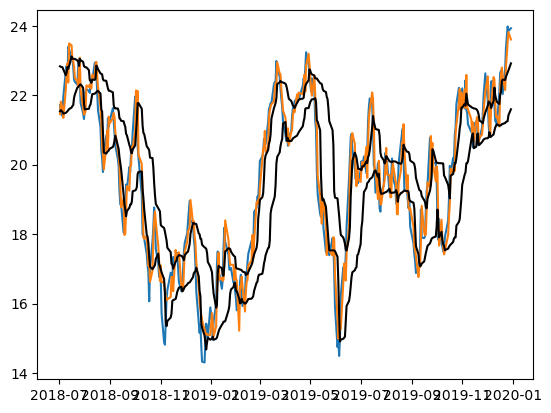

In [ ]:
plt.plot(portfolio_df_sent_test['moving_average_10day'])
plt.plot(portfolio_df_sent_test.index, model_predictions2['Random Forest']['y_pred'])
plt.plot(upper['2018-07-01':], color = 'black')
plt.plot(lower['2018-07-01':], color = 'black')

In [ ]:
rf_pred =  model_predictions2['Random Forest']['y_pred']
rf_pred = pd.Series(rf_pred)
rf_pred.index = portfolio_df_sent_test.index

In [ ]:
overall_sharpe_sentiment_prec_exp(rf_pred)[0]

0.05646672374326204

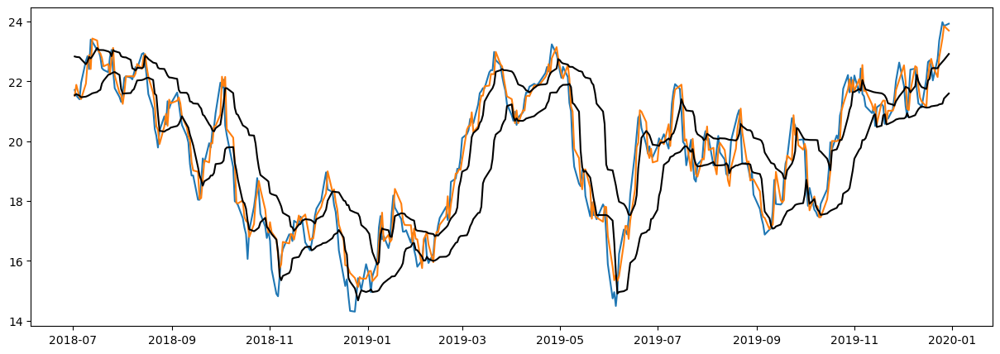

In [ ]:
plt.figure(figsize=(15,5))
plt.plot(portfolio_df_sent_test['moving_average_10day'])
plt.plot(portfolio_df_sent_test.index, predictions)
plt.plot(upper['2018-07-01':], color = 'black')
plt.plot(lower['2018-07-01':], color = 'black')

In [ ]:
gb_pred =  model_predictions2['Gradient Boosting']['y_pred']
gb_pred = pd.Series(gb_pred)
gb_pred.index = portfolio_df_sent_test.index

In [ ]:
overall_sharpe_sentiment_prec_exp(gb_pred)[0]

0.052054685266872215

In [ ]:
overall_sharpe_sentiment_precentiles(gb_pred)[0]

0.07424322431178275

<BarContainer object of 4 artists>

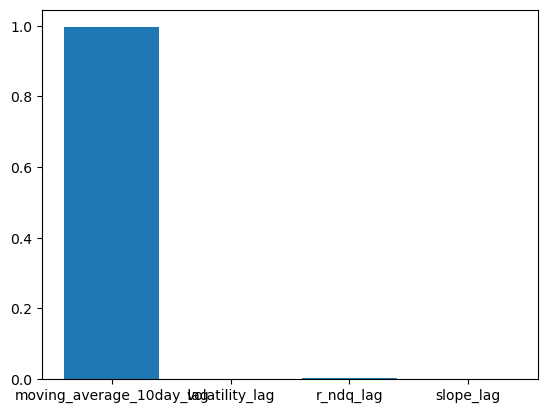

In [ ]:
plt.bar(X_train_ma.columns, rf_best_model.feature_importances_)

In [ ]:
overall_sharpe_sentiment_calc(final_prediction)

0.11395103638016794

In [ ]:
overall_sharpe_sentiment_calc(forecast_series)

0.09577475025334001

In [ ]:
overall_sharpe_sentiment_precentiles(forecast_series)[0]

0.07916726762775568

In [ ]:
overall_sharpe_sentiment_calc(portfolio_df_sent_test['moving_average_10day'])

0.16002022423460588

In [ ]:
overall_sharpe_sentiment_prec_exp(portfolio_df_sent_test['moving_average_10day'])[0]

0.14001041657537563

In [ ]:
overall_sharpe_sentiment_precentiles(final_prediction)[0]

0.08445538977333947

In [ ]:
overall_sharpe_sentiment_prec_exp(final_prediction)[0]

0.08584025473028456

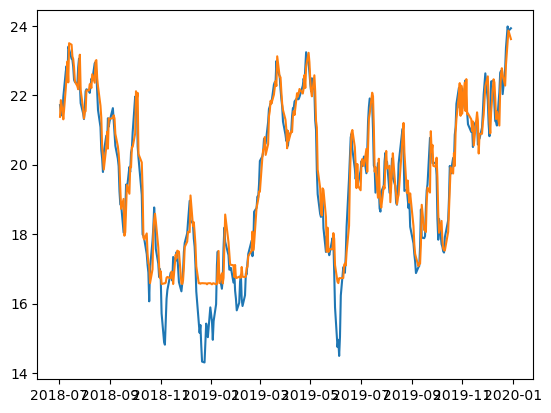

In [ ]:
plt.plot(y_test_ma)
plt.plot(final_prediction)

In [ ]:
overall_sharpe_sentiment_precentiles(final_prediction)[0]

NameError: name 'overall_sharpe_sentiment_precentiles' is not defined

In [ ]:
overall_sharpe_sentiment_prec_exp(final_prediction)[0]

0.08584025473028456

In [ ]:
portfolio_df_sent_test['trading day'].sum()

45

In [ ]:
# Define the parameter grid
gb_param_grid = {
    'n_estimators': [25, 75, 175, 200],
    'max_depth': [1, 3, 5],
    'min_samples_leaf': [1, 5, 6],
    'learning_rate': np.linspace(0.01, 0.15,15)
}

# Setup the grid search
gb_grid_search = GridSearchCV(GradientBoostingRegressor(random_state=42), gb_param_grid, cv=TimeSeriesSplit(), scoring='neg_mean_squared_error')
gb_grid_search.fit(X_train_ma, y_train_ma)

# Best model
gb_best_model = gb_grid_search.best_estimator_
print("Best parameters:", gb_grid_search.best_params_)
pred = gb_best_model.predict(X_test_ma)
print(r2_score(y_test_ma, pred))

pred = pd.Series(pred)
pred.index = y_test_ma.index
final_prediction_gb = pred[~pred.index.isin(pred.index.difference(portfolio_df_sent.index))]

Best parameters: {'learning_rate': 0.08999999999999998, 'max_depth': 1, 'min_samples_leaf': 1, 'n_estimators': 175}
0.9206879940785307


In [ ]:
overall_sharpe_sentiment_calc(final_prediction_gb)

0.1195750161278043

In [ ]:
overall_sharpe_sentiment_precentiles(final_prediction_gb)[0]

0.06997239526516837

In [ ]:
overall_sharpe_sentiment_prec_exp(final_prediction_gb)[0]

0.08559143654415355

<BarContainer object of 4 artists>

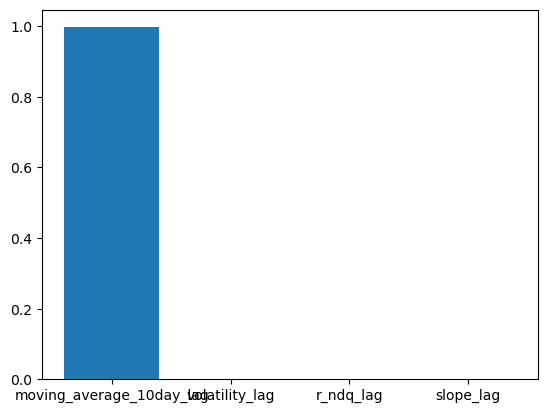

In [ ]:
plt.bar(X_train_ma.columns, gb_best_model.feature_importances_)

Text(0.5, 1.0, 'Market regime classification \n 10 day moving average of sentiment index')

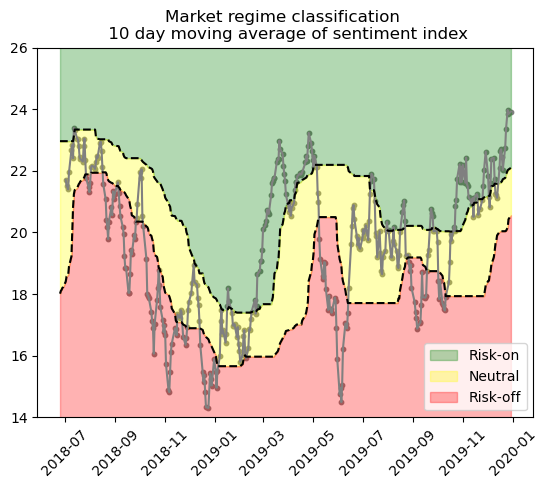

In [ ]:
plt.plot(portfolio_df_sent_test['moving_average_10day'], color = 'gray')
plt.scatter(portfolio_df_sent_test.index, portfolio_df_sent_test['moving_average_10day'], color = 'gray', s = 10)
plt.plot(portfolio_df_sent['2018-04-01':]['moving_average_10day'].rolling(60).quantile(0.75), color = 'black', linestyle='--')
plt.plot(portfolio_df_sent['2018-04-01':]['moving_average_10day'].rolling(60).quantile(0.25),color = 'black', linestyle='--')
plt.fill_between(x = portfolio_df_sent['2018-04-01':].index, y1 = portfolio_df_sent['2018-04-01':]['moving_average_10day'].rolling(60).quantile(0.75), y2 = 28, alpha = 0.3, color = 'green', label='Risk-on')
plt.fill_between(x = portfolio_df_sent['2018-04-01':].index, y1 = portfolio_df_sent['2018-04-01':]['moving_average_10day'].rolling(60).quantile(0.25), y2 =portfolio_df_sent['2018-04-01':]['moving_average_10day'].rolling(60).quantile(0.75), alpha = 0.3, color = 'yellow', label='Neutral')
plt.fill_between(x = portfolio_df_sent['2018-04-01':].index, y1 = 12.5, y2 = portfolio_df_sent['2018-04-01':]['moving_average_10day'].rolling(60).quantile(0.25), alpha = 0.3, color = 'red', label='Risk-off')
plt.ylim(14, 26)
plt.xticks(rotation=45) 
plt.legend(loc='lower right')
plt.title('Market regime classification \n 10 day moving average of sentiment index')
#plt.text(18075, 13, 'Risk-off', backgroundcolor = 'red')
#plt.text(18075, 19, 'Neutral', backgroundcolor = 'yellow')
#plt.text(18075, 23, 'Risk-on', backgroundcolor = 'green')

In [ ]:
pred_series = portfolio_df_sent['2018-03-01':'2019-01-01']['moving_average_10day'].append(final_prediction)

In [ ]:
pred_series

Date
2018-10-01    21.957302
2018-10-02    21.772642
2018-10-03    22.051755
2018-10-04    20.527079
2018-10-05    20.201228
                ...    
2019-12-23    22.001957
2019-12-24    22.782137
2019-12-26    23.484841
2019-12-27    23.825003
2019-12-30    23.729504
Length: 310, dtype: float64

In [ ]:
final_prediction

Date
2019-01-02    15.672098
2019-01-03    15.429694
2019-01-04    15.112405
2019-01-07    15.429694
2019-01-08    16.460352
                ...    
2019-12-23    22.001957
2019-12-24    22.782137
2019-12-26    23.484841
2019-12-27    23.825003
2019-12-30    23.729504
Length: 249, dtype: float64

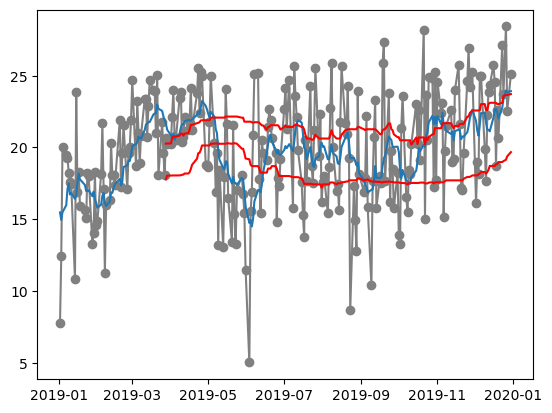

In [ ]:
plt.plot(portfolio_df_sent_test['sentiment_score'], color = 'gray')
plt.plot(portfolio_df_sent_test['moving_average_10day'])
plt.scatter(portfolio_df_sent_test.index, portfolio_df_sent_test['sentiment_score'], color = 'gray')
plt.plot(portfolio_df_sent_test['sentiment_score'].rolling(60).quantile(0.66), color = 'red')
plt.plot(portfolio_df_sent_test['sentiment_score'].rolling(60).quantile(0.33),color = 'red')

In [ ]:
sharpe, lower, upper = overall_sharpe_sentiment_precentiles(portfolio_df_sent_test['sentiment_score'])

In [ ]:
sharpe

0.37023385681236437

In [ ]:
#price_df.set_index('Date', inplace=True)

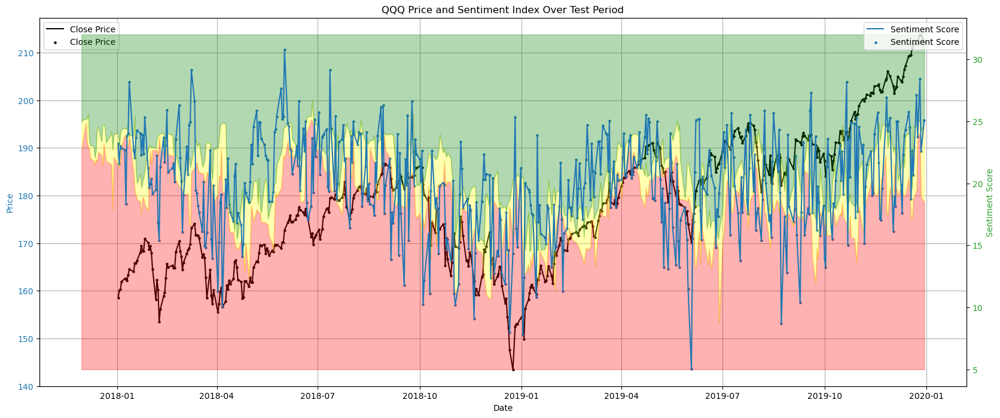

In [ ]:
import matplotlib.pyplot as plt

# Create a figure and a single subplot
fig, ax1 = plt.subplots(figsize=(20, 8))

# Plotting the price data on the first y-axis
ax1.set_xlabel('Date')  # Set the x-axis label
ax1.set_ylabel('Price', color='tab:blue')  # Set the y-axis label and color for the price data
#ax1.plot(price_df['Open']['2019-01-01':], color='tab:blue', label='Open Price')  # Plot the open prices
ax1.plot(price_df['Close']['2018-01-01':], color='black', label='Close Price')  # Plot the close prices
ax1.scatter(price_df['Close']['2018-01-01':].index, price_df['Close']['2018-01-01':], s=5, color='black', label='Close Price')  # Plot the close prices
ax1.tick_params(axis='y', labelcolor='tab:blue')  # Set the tick color for the y-axis
ax1.legend(loc='upper left')  # Place a legend in the upper left corner
ax1.grid(True)  # Enable grid
ax1.set_title('QQQ Price and Sentiment Index Over Test Period')  # Set title for the plot

# Creating a second y-axis that shares the same x-axis
ax2 = ax1.twinx()  # Instantiate a second axes that shares the same x-axis
ax2.set_ylabel('Sentiment Score', color='tab:green')  # Set the y-axis label and color for the sentiment data
ax2.plot(portfolio_df_sent['sentiment_score']['2018-01-01':], color='tab:blue', label='Sentiment Score')  # Plot the sentiment score
ax2.scatter(portfolio_df_sent['sentiment_score']['2018-01-01':].index, portfolio_df_sent['sentiment_score']['2018-01-01':], s=5, color='tab:blue', label='Sentiment Score')  # Plot the sentiment score
ax2.tick_params(axis='y', labelcolor='tab:green')  # Set the tick color for the y-axis
ax2.legend(loc='upper right')  # Place a legend in the upper right corner
plt.fill_between(x = portfolio_df_sent['2017-11-01':].index, y1 = 5, y2 = portfolio_df_sent['2017-11-01':]['sentiment_score'].shift(1).rolling(20).apply(lambda x: weighted_quantile(x, quantile=0.33), raw=True), alpha = 0.3, color = 'red', label='Risk-off')
plt.fill_between(x = portfolio_df_sent['2017-11-01':].index, y1 = portfolio_df_sent['2017-11-01':]['sentiment_score'].shift(1).rolling(20).apply(lambda x: weighted_quantile(x, quantile=0.33), raw=True), y2 =portfolio_df_sent['2017-11-01':]['sentiment_score'].shift(1).rolling(20).apply(lambda x: weighted_quantile(x, quantile=0.66), raw=True), alpha = 0.3, color = 'yellow', label='Neutral')
plt.fill_between(x = portfolio_df_sent['2017-11-01':].index, y1 = portfolio_df_sent['2017-11-01':]['sentiment_score'].shift(1).rolling(20).apply(lambda x: weighted_quantile(x, quantile=0.66), raw=True), y2 = 32, alpha = 0.3, color = 'green', label='Risk-on')

# Show the plot
plt.show()

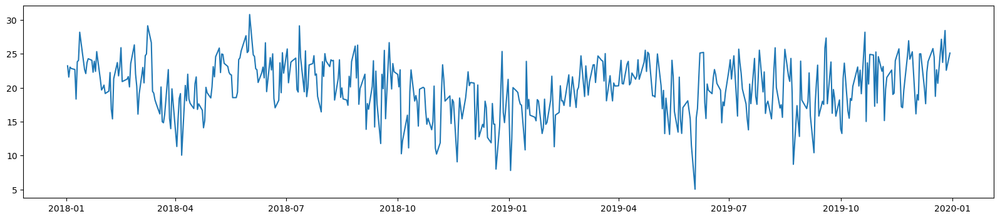

In [ ]:
plt.figure(figsize = (20,4))
plt.plot(portfolio_df_sent_test['sentiment_score'])
plt.plot()

In [ ]:
overall_sharpe_sentiment_precentiles(portfolio_df_sent_test['moving_average_10day'])[0]

0.12188948614884848

In [ ]:
portfolio_df_sent_rolling = portfolio_df_sent['moving_average_10day']['2017-10-01':]

In [ ]:
portfolio_df_sent_test

,r_ndq,r_rf,Volatility,rf_rate,sentiment_score,sentiment_slope,lag_sentiment,moving_average_10day
Date,,,,,,,,
2018-01-02,0.017527,-0.003315,11.00,0.000057,23.218681,0.639306,22.636305,20.565419
2018-01-03,0.009716,0.001046,10.25,0.000056,21.562063,1.396310,23.218681,19.783021
2018-01-04,0.001750,-0.000475,11.85,0.000056,23.031314,0.990790,21.562063,20.162382
2018-01-05,0.010043,-0.001235,11.94,0.000055,22.833049,2.735471,23.031314,20.314249
2018-01-08,0.003891,-0.000475,11.97,0.000058,22.679455,-0.574055,22.594403,20.855645
...,...,...,...,...,...,...,...,...
2019-12-23,0.002641,-0.000906,12.34,0.000063,27.140579,-0.659049,20.300683,22.753680
2019-12-24,0.000519,0.001724,12.36,0.000063,23.723393,-2.178170,27.140579,23.362800
2019-12-26,0.008824,0.001450,12.58,0.000063,28.429432,1.745469,21.436675,23.977012


In [ ]:
def overall_sharpe_sentiment_precentiles(sentiment):
    w_ndq = []
    w_rf = []

    upper = portfolio_df_sent_rolling.shift(1).rolling(60, min_periods = 1).quantile(0.75)
    lower = portfolio_df_sent_rolling.shift(1).rolling(60, min_periods = 1).quantile(0.25)
    #test_sent = sentiment['2018-01-01':]
    for i in sentiment.index:
        score = sentiment[i]
        if score > upper[i]: #23: changing to see if it improves
            w_ndq.append(0.8)
            w_rf.append(0.2)
        elif score <= upper[i] and score > lower[i]: # was 20:
            w_ndq.append(0.6)
            w_rf.append(0.4)
        elif score <= lower[i]:
            w_ndq.append(0.2)
            w_rf.append(0.8)
    portfolio_df_sent_test['w_ndq'] = w_ndq
    portfolio_df_sent_test['w_rf'] = w_rf
    portfolio_df_sent_test['r_portfolio'] = portfolio_df_sent_test['w_ndq'] * portfolio_df_sent_test['r_ndq'] + portfolio_df_sent_test['w_rf'] * portfolio_df_sent_test['r_rf']
    portfolio_df_sent_test['excess returns'] = portfolio_df_sent_test['r_portfolio'] - portfolio_df_sent_test['daily_rf']
    portfolio_df_sent_test['trading day'] = (portfolio_df_sent_test['w_ndq'] != portfolio_df_sent_test['w_ndq'].shift(1)).astype(int)
    mean_return_portfolio = portfolio_df_sent_test['r_portfolio'].mean()
    std_excess = np.std(portfolio_df_sent_test['excess returns'])
    mean_risk_free_rate = portfolio_df_sent_test['daily_rf'].mean()
    sharpe_ratio = (mean_return_portfolio - mean_risk_free_rate)/std_excess
    return sharpe_ratio, upper, lower

In [ ]:
sharpe, upper, lower = overall_sharpe_sentiment_precentiles(final_prediction)

In [ ]:
sharpe

0.08445538977333947

In [ ]:
sharpe2, upper2, lower2 = overall_sharpe_sentiment_precentiles(pred_series)

In [ ]:
sharpe2

0.15294778547888946

In [ ]:
sharpe3, upper3, lower3 = overall_sharpe_sentiment_precentiles(portfolio_df_sent['sentiment_score']['2018-05-01':])

In [ ]:
sharpe3

0.4090602400107156

In [ ]:
sharpe

0.13648397063874276

In [ ]:
sharpe2

0.13147713123253804

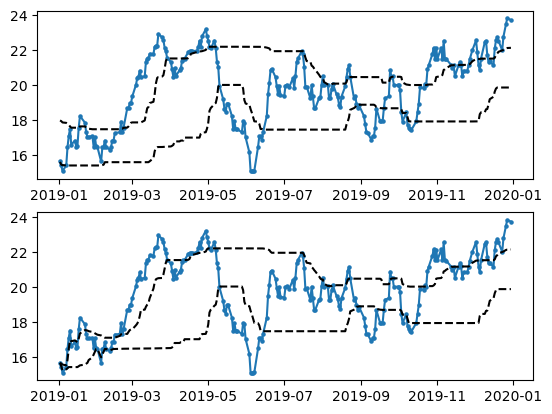

In [ ]:
plt.figure()
plt.subplot(2,1,1)
plt.plot(final_prediction)
plt.scatter(final_prediction.index, final_prediction, s = 5)
plt.plot(upper2['2019-01-01':], color = 'black', linestyle = '--')
plt.plot(lower2['2019-01-01':], color = 'black', linestyle = '--')
#plt.subplot(2,2,2)
#plt.plot(portfolio_df_sent_test['w_ndq'])

plt.subplot(2,1,2)
plt.plot(final_prediction)
plt.scatter(final_prediction.index, final_prediction, s = 5)
plt.plot(final_prediction.index, upper, color = 'black', linestyle = '--')
plt.plot(final_prediction.index, lower, color = 'black', linestyle = '--')
#plt.subplot(2,2,4)
#plt.plot(portfolio_df_sent_test['w_ndq'])
plt.show()

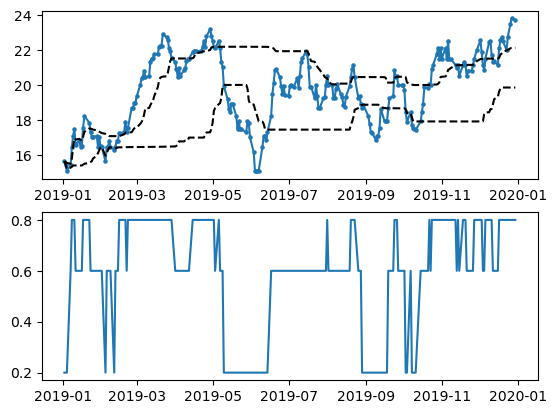

In [ ]:
plt.figure()
plt.subplot(2,1,1)
plt.plot(final_prediction)
plt.scatter(final_prediction.index, final_prediction, s = 5)
plt.plot(final_prediction.index, upper, color = 'black', linestyle = '--')
plt.plot(final_prediction.index, lower, color = 'black', linestyle = '--')
plt.subplot(2,1,2)
plt.plot(portfolio_df_sent_test['w_ndq'])
plt.show()

In [ ]:
sharpe, sharpe2

(0.13648397063874276, 0.13147713123253804)

In [ ]:
portfolio_df_sent_test['trading day'].sum()

44

In [ ]:
ma_data = portfolio_df_sent['2018-10-01':'2019-01-01']['moving_average_10day'].append(portfolio_df_sent_test['moving_average_10day'])

In [ ]:
sharpe, upper, lower = overall_sharpe_sentiment_precentiles(ma_data)

In [ ]:
sharpe

0.19933460279186893

In [ ]:
upper.shape

(310,)

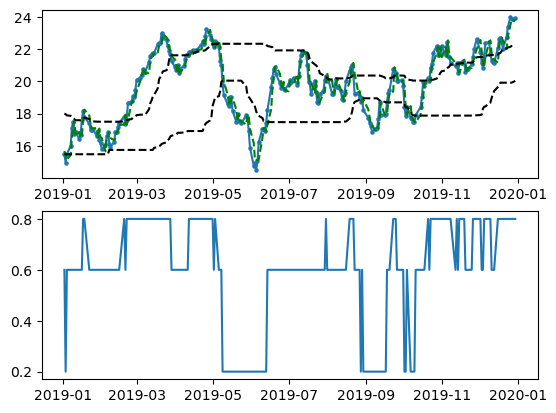

In [ ]:
plt.figure()
plt.subplot(2,1,1)
plt.plot(portfolio_df_sent_test['moving_average_10day'])
plt.scatter(portfolio_df_sent_test.index, portfolio_df_sent_test['moving_average_10day'], s = 5)
plt.plot(final_prediction, color = 'green', linestyle = '--')
plt.plot(portfolio_df_sent_test.index, upper['2019-01-01':], color = 'black', linestyle = '--')
plt.plot(portfolio_df_sent_test.index, lower['2019-01-01':], color = 'black', linestyle = '--')
plt.subplot(2,1,2)
plt.plot(portfolio_df_sent_test['w_ndq'])
plt.show()

In [ ]:
overall_sharpe_sentiment_precentiles(portfolio_df_sent['sentiment_score'])

(0.39713324214350637,
 Date
 2015-01-05    17.779190
 2015-01-06    17.702248
 2015-01-07    18.260302
 2015-01-08    19.823184
 2015-01-09    19.972191
                 ...    
 2019-12-23    24.587818
 2019-12-24    24.587818
 2019-12-26    24.685020
 2019-12-27    24.685020
 2019-12-30    24.839692
 Name: sentiment_score, Length: 1247, dtype: float64,
 Date
 2015-01-05    17.779190
 2015-01-06    17.471422
 2015-01-07    17.548364
 2015-01-08    17.625306
 2015-01-09    17.702248
                 ...    
 2019-12-23    17.716393
 2019-12-24    17.716393
 2019-12-26    18.045541
 2019-12-27    18.045541
 2019-12-30    18.159355
 Name: sentiment_score, Length: 1247, dtype: float64)

----------------------------------------------
rolling window with exponentially decaying weights:

In [ ]:
# Define the window size and alpha for exponential decay
window_size = 60
alpha = 0.5

# Compute exponential weights
weights = np.array([alpha**(i) for i in range(window_size)])

# Normalize weights
weights /= weights.sum()

# Define the custom function to apply
def weighted_avg(values):
    return np.dot(values, weights)


In [ ]:
# Define the window size and alpha for exponential decay
window_size = 60
alpha = 0.9

# Compute exponential weights
weights = np.array([alpha**(i) for i in range(window_size)])
weights = np.flip(weights)

# Normalize weights
weights /= weights.sum()

# Define the custom function to calculate quantiles with weights
def weighted_quantile(values, quantile=0.5):
    # Ensure the values are sorted
    sorter = np.argsort(values)
    values_sorted = values[sorter]
    weights_sorted = weights[sorter]

    # Compute the cumulative sum of weights
    cumsum = np.cumsum(weights_sorted)

    # Find where the cumulative sum equals or exceeds the quantile
    return np.interp(quantile, cumsum, values_sorted)

In [ ]:
portfolio_df_sent_rolling.shift(1).rolling(60).apply(lambda x: weighted_quantile(x, quantile=0.75), raw=True).dropna()

Date
2017-12-28    23.620690
2017-12-29    23.190788
2018-01-02    23.155518
2018-01-03    22.535509
2018-01-04    22.213826
                ...    
2019-12-23    22.464596
2019-12-24    22.699765
2019-12-26    22.753680
2019-12-27    23.362800
2019-12-30    23.727263
Name: moving_average_10day, Length: 500, dtype: float64

In [ ]:

def overall_sharpe_sentiment_prec_exp(sentiment):
    w_ndq = []
    w_rf = []

    # Assuming 'sentiment' is a pandas Series
    upper = portfolio_df_sent_rolling.shift(1).rolling(60).apply(lambda x: weighted_quantile(x, quantile=0.75), raw=True)
    lower = portfolio_df_sent_rolling.shift(1).rolling(60).apply(lambda x: weighted_quantile(x, quantile=0.25), raw=True)
    test_sent = sentiment['2018-07-01':]
    for i in test_sent.index:
        score = sentiment[i]
        if score > upper[i]: #23: changing to see if it improves
            w_ndq.append(0.8)
            w_rf.append(0.2)
        elif score <= upper[i] and score > lower[i]: # was 20:
            w_ndq.append(0.6)
            w_rf.append(0.4)
        elif score <= lower[i]:
            w_ndq.append(0.2)
            w_rf.append(0.8)
    portfolio_df_sent_test['w_ndq'] = w_ndq
    portfolio_df_sent_test['w_rf'] = w_rf
    portfolio_df_sent_test['r_portfolio'] = portfolio_df_sent_test['w_ndq'] * portfolio_df_sent_test['r_ndq'] + portfolio_df_sent_test['w_rf'] * portfolio_df_sent_test['r_rf']
    portfolio_df_sent_test['excess returns'] = portfolio_df_sent_test['r_portfolio'] - portfolio_df_sent_test['rf_rate']
    portfolio_df_sent_test['trading day'] = (portfolio_df_sent_test['w_ndq'] != portfolio_df_sent_test['w_ndq'].shift(1)).astype(int)
    mean_return_portfolio = portfolio_df_sent_test['r_portfolio'].mean()
    std_excess = np.std(portfolio_df_sent_test['excess returns'])
    mean_risk_free_rate = portfolio_df_sent_test['rf_rate'].mean()
    sharpe_ratio = (mean_return_portfolio - mean_risk_free_rate)/std_excess
    return sharpe_ratio, upper, lower

In [ ]:
overall_sharpe_sentiment_precentiles(final_prediction_gb)[0]

0.06997239526516837

In [ ]:
overall_sharpe_sentiment_prec_exp(final_prediction_gb)[0]

0.05603065199266541

--------------------------
optimizing precentiles:


Think it's not a great idea, gives worse results for test data!

In [ ]:
def sharpe_precentiles(r,s, portfolio_df_sent_train = portfolio_df_sent_train):
    w_ndq = []
    w_rf = []

    # Assuming 'sentiment' is a pandas Series
    portfolio_df_sent_train['upper'] = portfolio_df_sent_train['moving_average_10day'].rolling(60).apply(lambda x: weighted_quantile(x, quantile=s/100), raw=True)
    portfolio_df_sent_train['lower'] = portfolio_df_sent_train['moving_average_10day'].rolling(60).apply(lambda x: weighted_quantile(x, quantile=r/100), raw=True)
    portfolio_df_sent_train = portfolio_df_sent_train.dropna()
    for i in portfolio_df_sent_train.index:
        score = portfolio_df_sent_train['moving_average_10day'][i]
        if score > portfolio_df_sent_train['upper'][i]: #23: changing to see if it improves
            w_ndq.append(0.8)
            w_rf.append(0.2)
        elif score <= portfolio_df_sent_train['upper'][i] and score > portfolio_df_sent_train['lower'][i]: # was 20:
            w_ndq.append(0.6)
            w_rf.append(0.4)
        elif score <= portfolio_df_sent_train['lower'][i]:
            w_ndq.append(0.2)
            w_rf.append(0.8)
    portfolio_df_sent_train['w_ndq'] = w_ndq
    portfolio_df_sent_train['w_rf'] = w_rf
    portfolio_df_sent_train['r_portfolio'] = portfolio_df_sent_train['w_ndq'] * portfolio_df_sent_train['r_ndq'] + portfolio_df_sent_train['w_rf'] * portfolio_df_sent_train['r_rf']
    portfolio_df_sent_train['excess returns'] = portfolio_df_sent_train['r_portfolio'] - portfolio_df_sent_train['rf_rate']
    portfolio_df_sent_train['trading day'] = (portfolio_df_sent_train['w_ndq'] != portfolio_df_sent_train['w_ndq'].shift(1)).astype(int)
    mean_return_portfolio = portfolio_df_sent_train['r_portfolio'].mean()
    std_excess = np.std(portfolio_df_sent_train['excess returns'])
    mean_risk_free_rate = portfolio_df_sent_train['rf_rate'].mean()
    sharpe_ratio = (mean_return_portfolio - mean_risk_free_rate)/std_excess
    return sharpe_ratio

In [ ]:
from itertools import product
# Define ranges for r and s
r_values = np.linspace(15, 45, 31)  # from 5 to 15 in 0.5 increments
s_values = np.linspace(55, 90, 36)  # from 10 to 20 in 0.5 increments

# Grid search
max_sharpe = -np.inf
best_r, best_s = None, None
for r, s in product(r_values, s_values):
    #print('first loop', r, s)
    if s > r:  # Ensure s is always greater than r
        sharpe = sharpe_precentiles(r, s)
        #print(sharpe)
        if sharpe > max_sharpe:
            #print(r, s)
            max_sharpe = sharpe
            best_r, best_s = r, s

print(f'Best r: {best_r}, Best s: {best_s}, Maximized Overall Sharpe: {max_sharpe}')

Best r: 23.0, Best s: 89.0, Maximized Overall Sharpe: 0.09925883710961116


--------------------------------------------------------

New sharpe calculations:

In [ ]:
def sharpe_correct(sentiment):
    w_ndq = []
    w_rf = []

    # Assuming 'sentiment' is a pandas Series
    upper = portfolio_df_sent_rolling.shift(1).rolling(63).quantile(0.66) #apply(lambda x: weighted_quantile(x, quantile=0.75), raw=True)
    lower = portfolio_df_sent_rolling.shift(1).rolling(63).quantile(0.33) #apply(lambda x: weighted_quantile(x, quantile=0.25), raw=True)
    test_sent = sentiment['2018-07-01':]
    test_df = portfolio_df_sent_test['2018-07-01':]
    for i in test_sent.index:
        score = sentiment[i]
        if score > upper[i]: #23: changing to see if it improves
            w_ndq.append(0.8)
            w_rf.append(0.2)
        elif score <= upper[i] and score > lower[i]: # was 20:
            w_ndq.append(0.6)
            w_rf.append(0.4)
        elif score <= lower[i]:
            w_ndq.append(0.2)
            w_rf.append(0.8)
    test_df['w_ndq'] = w_ndq
    test_df['w_rf'] = w_rf
    test_df['r_portfolio'] = test_df['w_ndq'] * test_df['r_ndq'] + test_df['w_rf'] * test_df['r_rf']
    test_df['excess returns'] = test_df['r_portfolio'] - test_df['daily_rf']
    test_df['trading day'] = (test_df['w_ndq'] != test_df['w_ndq'].shift(1)).astype(int)
    
    test_df.reset_index(inplace=True)
    # Identify maximum index in the dataset
    max_index = test_df.index.max()

    # Initialize starting portfolio value
    initial_portfolio_value = 1

    # Create a new DataFrame to store calculated values
    df_calc = pd.DataFrame(index=test_df.index, columns=['portfolio_value', 'ndq_start', 'rf_start', 'ndq_end', 'rf_end'])
    
    # Initialize first values from row 0
    df_calc.loc[0, 'portfolio_value'] = initial_portfolio_value
    df_calc.loc[0, 'ndq_start'] = 0
    df_calc.loc[0, 'rf_start'] = 0
    df_calc.loc[0, 'ndq_end'] = w_ndq[0] * initial_portfolio_value
    df_calc.loc[0, 'rf_end'] = w_rf[0] * initial_portfolio_value

    # Loop through rows from 1 to max_index to calculate the required columns
    for i in range(1, max_index + 1):
        # Calculate ndq_start and rf_start
        df_calc.loc[i, 'ndq_start'] = df_calc.loc[i - 1, 'ndq_end'] * (1 + test_df.loc[i, 'r_ndq'])
        df_calc.loc[i, 'rf_start'] = df_calc.loc[i - 1, 'rf_end'] * (1 + test_df.loc[i, 'r_rf'])

        # Calculate the new portfolio value
        df_calc.loc[i, 'portfolio_value'] = df_calc.loc[i, 'ndq_start'] + df_calc.loc[i, 'rf_start']

        # Calculate ndq_end and rf_end based on updated portfolio value
        df_calc.loc[i, 'ndq_end'] =  w_ndq[i] * df_calc.loc[i, 'portfolio_value']
        df_calc.loc[i, 'rf_end'] = w_rf[i] * df_calc.loc[i, 'portfolio_value']
    
    return2019 = (df_calc['portfolio_value'][-1:]/df_calc['portfolio_value'][0]) **(1/(375/250)) - 1
    risk_free2019 = test_df['rf_rate'].mean()/100
    std2019 = np.std(test_df['excess returns'])*np.sqrt(250)

    test_df.set_index('Date', inplace=True)
    
    return (return2019 - risk_free2019)/std2019, df_calc, test_df



In [ ]:
portfolio_df_5day = portfolio_df_sent['2018-06-25':]

In [ ]:
portfolio_df_sent_test['moving_average_5day'] = portfolio_df_5day['sentiment_score'].rolling(window = 5).mean().dropna()

In [ ]:
sharpe, df_calc, test_df = sharpe_correct(portfolio_df_sent_test['sentiment_score'])

In [ ]:
sharpe

372    1.089679
Name: portfolio_value, dtype: object

In [ ]:
sharpe_gb, df_calc_gb, test_df_gb = sharpe_correct(final_prediction_gb)

In [ ]:
sharpe_gb

372    1.349343
Name: portfolio_value, dtype: object

In [ ]:
sharpe_bm, df_calc_bm, test_df_bm = sharpe_correct(portfolio_df_sent_rolling.shift(1).rolling(63).quantile(0.5))

In [ ]:
sharpe_bm

372    1.127166
Name: portfolio_value, dtype: object

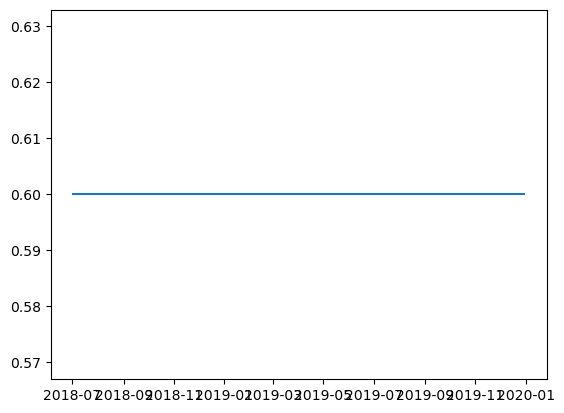

In [ ]:
plt.plot(test_df_bm['w_ndq'])

In [ ]:
sharpe_bm

372    1.321201
Name: portfolio_value, dtype: object

In [ ]:
sharpe

372    2.089771
Name: portfolio_value, dtype: object

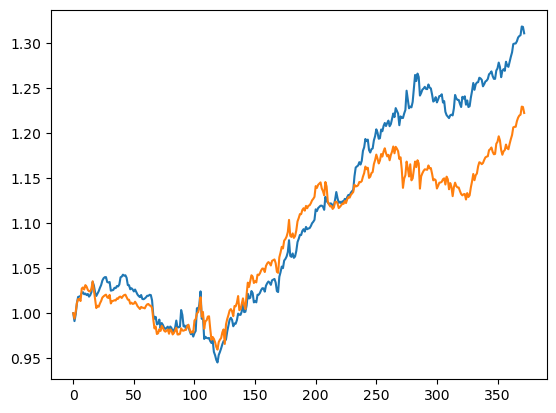

In [ ]:
plt.plot(df_calc['portfolio_value'])
plt.plot(df_calc_gb['portfolio_value'])

In [ ]:
df_calc

,portfolio_value,ndq_start,rf_start,ndq_end,rf_end
0,1,0,0,0.6,0.4
1,0.994073,0.593056,0.401017,0.198815,0.795258
2,0.996618,0.201282,0.795336,0.199324,0.797295
3,1.000419,0.202424,0.797995,0.600251,0.400168
4,1.004806,0.605652,0.399153,0.803844,0.200961
...,...,...,...,...,...
368,1.091884,0.656059,0.435825,0.873508,0.218377
369,1.092715,0.873961,0.218753,0.874172,0.218543
370,1.100745,0.881885,0.21886,0.880596,0.220149
371,1.100322,0.879855,0.220468,0.880258,0.220064


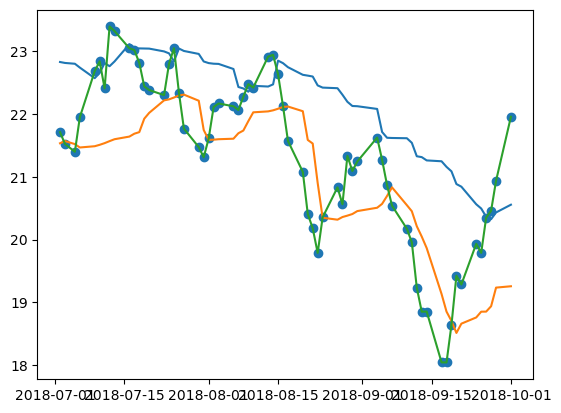

In [ ]:
plt.plot(upper['2018-07-01':'2018-10-01'])
plt.plot(lower['2018-07-01':'2018-10-01'])
plt.plot(portfolio_df_sent_test['moving_average_10day']['2018-07-01':'2018-10-01'])
plt.scatter(portfolio_df_sent_test['2018-07-01':'2018-10-01'].index , portfolio_df_sent_test['moving_average_10day']['2018-07-01':'2018-10-01'])

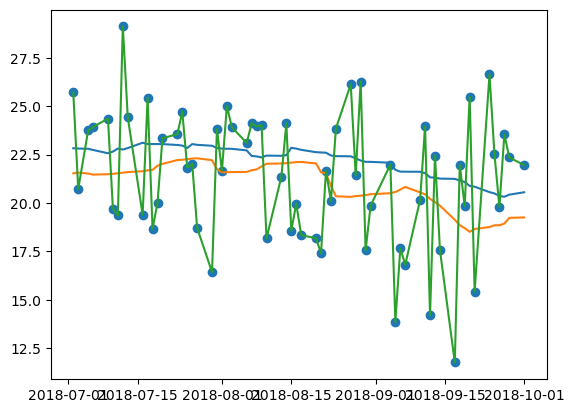

In [ ]:
plt.plot(upper['2018-07-01':'2018-10-01'])
plt.plot(lower['2018-07-01':'2018-10-01'])
plt.plot(portfolio_df_sent_test['sentiment_score']['2018-07-01':'2018-10-01'])
plt.scatter(portfolio_df_sent_test['2018-07-01':'2018-10-01'].index , portfolio_df_sent_test['sentiment_score']['2018-07-01':'2018-10-01'])

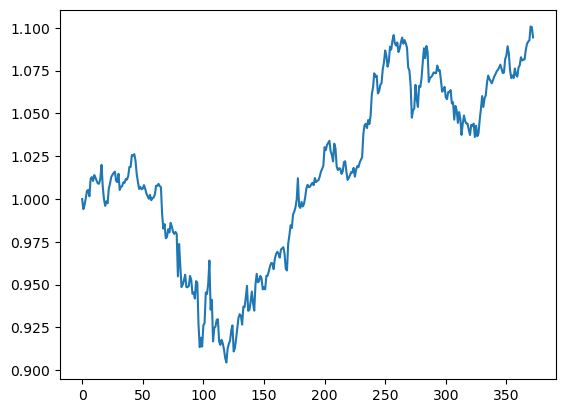

In [ ]:
plt.plot(df_calc['portfolio_value'])